# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

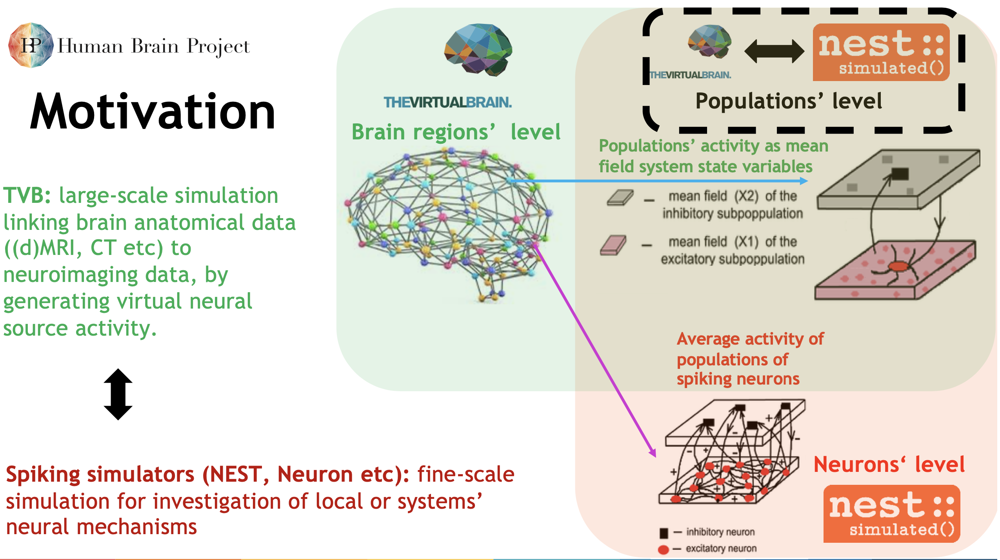

In [2]:
from IPython.core.display import Image, display
display(Image(filename='./pics/ConceptGraph1.png',  width=1000, unconfined=False))

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

# TVB - NEST co-simulation with Reduced Wong-Wang model

We demonstrate a multiscale simulation <br> of a reduced Wong-Wang model [3, 4] <br> using TVB [1, 2] for brain regions modelled at coarse scale, <br> and NEST [5] for regions modelled as <br> networks of spiking neural populations [6-8].

## Reduced Wong-Wang mean field model

For every region node $n\prime$ modelled as a mean-field node in TVB:

(Post)Synaptic gating dynamics (i.e., proportion of synapse channels open at any given time):

$\dot{S_{n\prime}}^{(E)} = - \frac{1}{\tau_E}{S_{n\prime}}^{(E)}(t) + (1-{S_{n\prime}}^{(E)}(t))\gamma_{E} {R_{n\prime}}^{(E)}(t)$

$\dot{S_{n\prime}}^{(I)} = - \frac{1}{\tau_I}{S_{n\prime}}^{(I)}(t) + \gamma_I{R_{n\prime}}^{(I)}(t)$

where we bound ${S_{n\prime}}^{(E/I)}(t) \in $ [0.0, 1.0], 

and $ {R_{n\prime}}^{(E/I)}(t) $ is the postsynaptic firing rate given by:

$ {R_{n\prime}}^{(E/I)}(t) = H({I_{syn_{n\prime}}}^{(E/I)}(t), a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) $

where

$ H({I_{syn_{n\prime}}}^{(E/I)}(t),  a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) = \frac{a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)}}{1-e^{-d_{(E/I)}(a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)})}}$ 

is a sigmoidal activation function of the input presynaptic current.

The total input presynaptic current to excitatory populations is given by: 

$ {I_{syn_{n\prime}}}^{(E)}(t) = W_EI_o + w_+J_{NMDA}{S_{n\prime}}^{(E)}(t) - J_{{n\prime}}{S_{n\prime}}^{(I)}(t) + GJ_{NMDA}a_c\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

and to inhibitory ones:

$ {I_{syn_{n\prime}}}^{(I)}(t) = W_II_o + J_{NMDA}{S_{n\prime}}^{(E)}(t) - {S_{n\prime}}^{(I)}(t) +  \lambda GJ_{NMDA}a_c\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

where 
$\lambda  \in$[0, 1] for scaling feedforward inhibition.



## Reduced Wong-Wang mean field model

## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{{m\prime}{n\prime}}$ (${m\prime}->{n\prime}$)
- structural TVB connectivity delays $\tau_{{m\prime}{n\prime}}$  (${m\prime}->{n\prime}$)
- global structural brain connectivity coupling constant $G$
- multiplicative coefficient of TVB's linear ($a_c*x + b_c$) coupling function $a_c=1.0/256$, 
  assuming $b_c=0.0$
- overall effective external input current $I_o = 0.382nA$ 
- excitatory synaptic coupling $J_{NDMA} = 0.15nA$ 
- local feedback inhibitory synaptic coupling $J_{i} = 1.0nA$ 
- local excitatory recurrence $w_+ = 1.4$
- excitatory kinetic parameter $\gamma_E = 0.641 s$
- inhibitory kinetic parameter $\gamma_I = 1.0 s$
- excitatory (NMDA) time constant $\tau_E = \tau_{NMDA}=100ms$ 
- inhibitory (GABA) time constant $\tau_I = \tau_{GABA}=10ms$ 
- excitatory pool scaling constant $W_E = 1.0$
- inhibitory pool scaling constant $W_I = 0.7$
- excitatory sigmoidal functions parameters $a_{E} = 310nC^{-1}$, $b_{E} = 125Hz$, $d_{E} = 0.16s$
- inhibitory sigmoidal functions parameters $a_{I} = 615nC^{-1}$, $b_{I} = 177Hz$, $d_{I} = 0.087s$
- $\lambda = 1$, allowing for feedforward inhibition


## Spiking network model in NEST

For every neuron $i$ in region node $n$ modelled in NEST as a spiking network of "integrate and fire" neurons with alpha synapses:


$ C_m{\dot{V}_{ni}}^m = - {I_{ni}}^L(t) - {I_{ni}}^{ex}(t) - {I_{ni}}^{in}(t) + {I_{ni}}^{ext}(t) + 
 Ga_c\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n})$

$\;\;\;\;\;\;\;\;\;\;=-g_L({V_{ni}}^m(t) - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-g_{ex_{ni}}({V_{ni}}^m(t) - V_{ex}) $

$\;\;\;\;\;\;\;\;\;\;\;-g_{in_{ni}}({V_{ni}}^m(t) - V_{in}) $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext}(t) + 
 Ga_c\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n})$

$ \ddot{g}_{ex_{ni}} = -\frac{1}{\tau_{syn_{ex}}}\dot{g}_{ex_{ni}} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j<-E}$

$ \dot{g}_{ex_{ni}} = \dot{g}_{ex_{ni}} -\frac{g_{ex_{ni}}}{\tau_{syn_{ex}}}$

$ \ddot{g}_{in_{ni}} = -\frac{1}{\tau_{syn_{in}}}\dot{g}_{in_{ni}} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j<-I}$

$ \dot{g}_{in_{ni}} = \dot{g}_{in_{ni}} -\frac{g_{in_{ni}}}{\tau_{syn_{in}}}$

When $V_m(t) > V_{th}$, emit a spike and clamp $V_m(t)$ to $V_{reset}$ for $\tau_{ref}$ ms.


## TVB to NEST coupling

When TVB couples to NEST via instantaneous spike rate $ N_E{R_{n\prime}}^{(E/I)}(t) $, spike generator NEST devices are used as TVB "proxy" nodes and generate spike trains 

$ Ga_c\sum_{n\prime n}C_{n\prime \neq n}\left[\sum_k\delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime} $

Instead, when TVB couples to NEST via current injection, the term 

$ Ga_c\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n})$,

which is scaled by $\lambda$ for inhibitory neurons,

denotes possible inputs by NEST dc current generator devices that can play the role of TVB "proxy" nodes, i.e., mirroring their activity, where

$ I_{n\prime n,i}^{dc}(t) = N_EJ_{NMDA}{S_{n\prime}}^{(E)}(t) $

Similarly, $I_{ni}^{ext}(t)$ is an external current parameter that can be updated at each time step based on the TVB large-scale delayed coupling input towards region node n:

for excitatory neurons:

$I_{n,exc}^{ext}(t) = N_EGJ_{NMDA}a_c\sum_{{n\prime} n}C_{{n\prime}}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

and for inhibitory ones:

$I_{n,inh}^{ext}(t) = N_E\lambda GJ_{NMDA}a_c\sum_{{n\prime}n}C_{{n\prime}n}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

 
Notice that all large-scale input is always scaled with the size of the excitatory population $ N_E $.


## NEST to TVB update

A NEST spike recorder device is used to count spikes for each time step, and compute an instant population mean rate that overrides the TVB state variables $R_{n}^{E/I}$ after low pass filtering via a linear dynamical equation:

$ {\dot{R}_{n}}^{E/I}  = -\frac{1}{\tau_{{R_{in_{n}}}}^{E/I}}({R_{n}}^{E/I}(t) - {R_{in_{n}}}^{E/I}(t)) $

where:

$ {R_{in_{n}}}^{E/I}(t) =  \frac{\sum_j\left[ \sum_k \delta(t-\tau_n-{t_j}^k) \right]_{j \in (E/I)_n}}{N_{(E/I)}} $

and $ \tau_{R_{in_{n}}}^{E/I} = 1.0 ms $ by default

This update process concerns only the TVB region nodes that are simulated exclusively in NEST, as spiking networks. All the rest of TVB nodes will follow the equations of the mean field model described above.


# WORKFLOW:

In [2]:
import os
from collections import OrderedDict
import time
import numpy as np

# Importing and setting LIBRARY_PROFILE for TVB scripting
from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

# Importing and setting some configurations for tvb_multiscale and tvb_nest
from tvb_multiscale.tvb_nest.config import *

work_path = os.getcwd()
outputs_path = os.path.join(work_path, "outputs/RedWongWang")
config = Config(output_base=outputs_path)

config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'
config.figures.DEFAULT_SIZE= config.figures.NOTEBOOK_SIZE
FIGSIZE = config.figures.DEFAULT_SIZE

# Importing and creating a Plotter class object
from tvb_multiscale.core.plot.plotter import Plotter
plotter = Plotter(config.figures)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 


## 1. Load structural data <br> (minimally a TVB connectivity)  <br> & prepare TVB simulator  <br> (region mean field model, integrator, monitors etc)

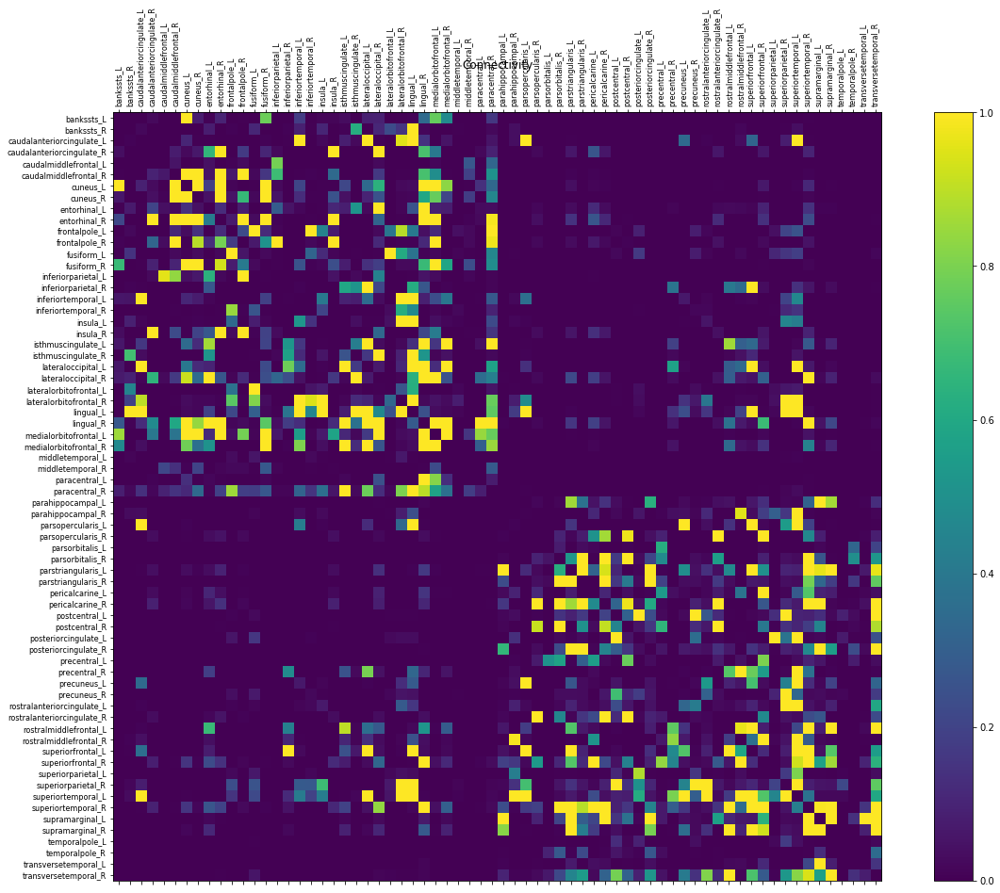

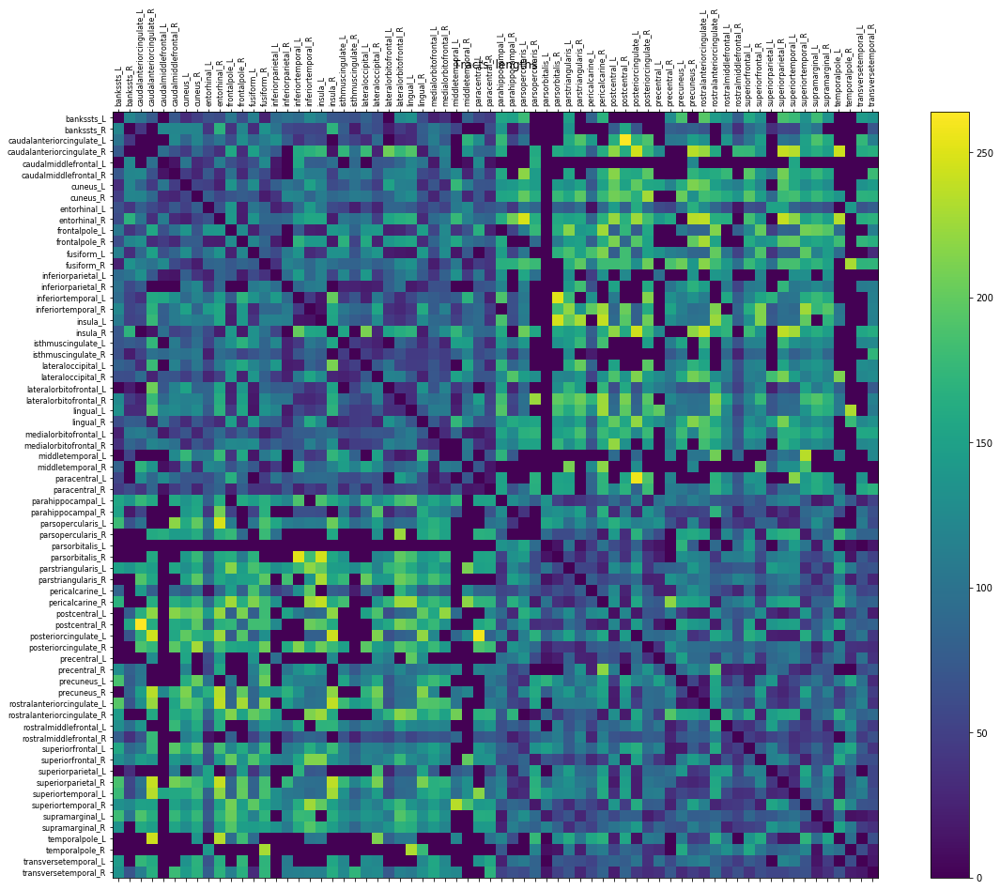

In [3]:
from tvb.simulator.models.reduced_wong_wang_exc_io_inh_i import ReducedWongWangExcIOInhI


# # ----------------------1. Build a TVB simulator (model, integrator, monitors...)----------------------------------
# # Create a TVB simulator using the tvb-multiscale helper SimulatorBuilder class
# from tvb_multiscale.core.tvb.simulator_builder import SimulatorBuilder
# simulator_builder = SimulatorBuilder()
# simulator_builder.connectivity = config.DEFAULT_CONNECTIVITY_ZIP  
# simulator_builder.model = ReducedWongWangExcIOInhI
# model_params = {"G": np.array([20.0, ]), "J_i": np.array([1.0, ]), "lamda": np.array([0.0, ])}
# simulator = simulator_builder.build(**model_params)


# ----------------------------------------------------------------------------------------------------------------
# ---------------------------Uncomment below to create the TVB simulator manually:--------------------------------
# ----------------------------------------------------------------------------------------------------------------

# Configuring the connectivity:
from tvb.datatypes.connectivity import Connectivity
# Load default TVB connectivity from ZIP file:
connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)
# Normalize connectivity weights
# Normalization with the maximum per-region/node sum of outgoing connections' weights
# i.e. normalisation_factor = numpy.max(numpy.abs(connectivity.weights.sum(axis=1))):
connectivity.weights = connectivity.scaled_weights(mode="region")
# Further normalization to scale and ceil the connectivity weights:
connectivity.weights /= np.percentile(connectivity.weights, 95)
connectivity.weights[connectivity.weights>1.0] = 1.0
connectivity.configure() # configure now in order to plot

from tvb.simulator.cosimulator import CoSimulator
# Create a TVB simulator and set all desired inputs
# (connectivity, model, surface, stimuli etc)
# We choose all defaults in this example
simulator = CoSimulator()
simulator.model = ReducedWongWangExcIOInhI()  # setting the node mean field model...
# ...and modifying some of its parameters:
simulator.model.G = np.array([20.0, ])     # Global cloupling scaling
simulator.model.J_i = np.array([1.0, ])    # Feedback inhibition
simulator.model.lamda = np.array([0.0, ])  # Feedforward inhibition

# Setting the connectivity:
simulator.connectivity = connectivity 

#Setting the coupling function:
from tvb.simulator.coupling import Linear
# TVB linear coupling of the form: a*x + b with default values of a = 1.0/256 and b = 0.0
simulator.coupling = Linear(a=np.array([1.0/256]), b=np.array([0.0]))

# Setting the integrator:
from tvb.simulator.integrators import HeunStochastic
simulator.integrator = HeunStochastic()
simulator.integrator.dt = 0.1 # the TVB time step of integration
simulator.integrator.noise.nsig = np.array([0.001]) # the amplitude (standard deviation) of noise 

# Setting a tuple of TVB monitors
from tvb.simulator.monitors import Raw  # , Bold, EEG
# Raw monitor records all state variables of the model
mon_raw = Raw(period=1.0)  # sampling period in ms
simulator.monitors = (mon_raw, )  # , Bold, EEG

# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

plotter.plot_tvb_connectivity(simulator.connectivity);


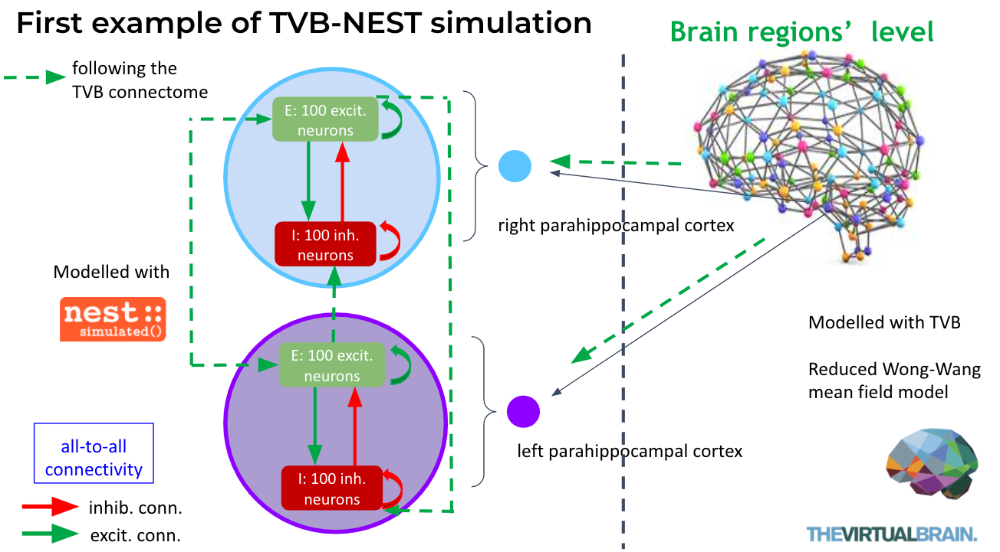

In [4]:
display(Image(filename='./pics/Example_Net.png',  width=1000, unconfined=False))

## 2. Build and connect the NEST network model <br> (networks of spiking neural populations for fine-scale <br>regions, stimulation devices, spike recorders etc)

In [5]:
# Select the regions for the fine scale modeling with NEST spiking networks
number_of_regions = simulator.connectivity.region_labels.shape[0]
nest_nodes_ids = []  # the indices of fine scale regions modeled with NEST
# We model parahippocampal cortices (left and right) with NEST
for id in range(number_of_regions):
    if simulator.connectivity.region_labels[id].find("hippo") > 0:
        nest_nodes_ids.append(id)
        

# Import and configure a NESTModelBuilder class:
from tvb_multiscale.tvb_nest.nest_models.builders.models.default_exc_io_inh_i import DefaultExcIOInhIBuilder

nest_model_builder = DefaultExcIOInhIBuilder(simulator, nest_nodes_ids, config=config, set_defaults=False)

nest_model_builder.population_order = 100  # scalable population size

# Parameters for coupling between region nodes configured on the basis of the respective TVB parameters:
nest_model_builder.global_coupling_scaling = \
    nest_model_builder.tvb_simulator.coupling.a[0].item() * nest_model_builder.tvb_model.G[0].item()
nest_model_builder.lamda = nest_model_builder.tvb_model.lamda[0].item()


# # Using all default parameters for this example
# nest_model_builder.set_defaults()
# # The number of neurons for exc and inh populations:
# N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
# N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)


# or...


# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------
from copy import deepcopy

population_neuron_model = "iaf_cond_alpha"

nest_model_builder.population_order = 100

nest_model_builder.scale_e = 1.0
nest_model_builder.scale_i = 1.0

N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)


# ----------------------------------------------------------------------------------------------------------------
# -----------------------------Uncomment below to configure the builder manually:---------------------------------
# ----------------------------------------------------------------------------------------------------------------
from copy import deepcopy


# 1. Populations' configurations

population_neuron_model = "iaf_cond_alpha"  # the NEST spiking neuron model used

# The number of neurons for exc and inh populations:
nest_model_builder.scale_e = 1.0  # scaling exc population size
nest_model_builder.scale_i = 1.0  # scaling inh population size

N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)

# When any of the properties 
# model, params and scale
# depends on regions, 
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property
nest_model_builder.populations = [
    {"label": "E", # string label for population
     "model": population_neuron_model, # the NEST spiking neuron model
     "nodes": None,  # list of regions' indices or None which means "all", 
                     # i.e., building this population on all spiking regions 
     "params": {}, # dict of parameters of the the NEST spiking neuron model to be optionally modified
     "scale": nest_model_builder.scale_e},
    {"label": "I", "model": population_neuron_model,
     "nodes": None,  "params": {},"scale": nest_model_builder.scale_i}
  ]


# 2. Within region-node connections
# When any of the properties model, conn_spec, weight, delay, receptor_type 
# depend on the regions,
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property

synapse_model = "static_synapse"  # the synapse model, 
                                  # NEST static_synapse just multiplies presynaptic spikes with a weight
# Dict of properties of connections among neurons:
conn_spec = {'rule': "all_to_all", 
             "allow_autapses": True, 'allow_multapses': True, 
             # parameters relating to other connectivity rules:
             "indegree": None, "outdegree": None, "N": None, "p": 0.1  
            }

# from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates import \
#     random_normal_weight, random_uniform_tvb_delay

# Default within region weights (sign determines exc or inh):
w_e = 1.0  # exc -> exc, exc -> inh
# w_e = random_normal_weight(w_e, sigma=0.1) 
# w_e = {"distribution": "normal", "mu": w_e, "sigma": 0.1*w_e}
w_ie = -nest_model_builder.tvb_model.J_i[0].item() # inh -> exc
# w_ie = random_normal_weight(w_ie, sigma=0.1) 
# w_ie =  {"distribution": "normal", "mu": w_ie, "sigma": 0.1 * np.abs(w_ie)}
w_ii = -1 # inh -> inh
# w_ii = random_normal_weight(w_ii, sigma=0.1) 
# w_ii =  {"distribution": "normal", "mu": w_ii, "sigma": 0.1 * np.abs(w_ii)}


within_node_delay = nest_model_builder.default_min_delay
#                     {"distribution": "uniform", 
#                      "low": np.minimum(nest_model_builder.default_min_delay, 
#                                        nest_model_builder.default_populations_connection["delay"]), 
#                      "high": np.maximum(nest_model_builder.tvb_dt, 
#                                         2*nest_model_builder.default_populations_connection["delay"])}

nest_model_builder.populations_connections = [
     #              ->
    {"source": "E", "target": "E",  # E -> E This is a self-connection for population "E"
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": w_e, "delay": within_node_delay,
     "receptor_type": 0, # synaptic port to be modified for multisynapse NEST spiking models
     "nodes": None},  # None means apply to all spiking regions
    {"source": "E", "target": "I",  # E -> I
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": w_e, "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  
    {"source": "I", "target": "E",  # I -> E
     "synapse_model": synapse_model, "conn_spec": conn_spec, 
     "weight": w_ie, "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  #
    {"source": "I", "target": "I",  # I -> I This is a self-connection for population "I"
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": w_ii, "delay": within_node_delay,
     "receptor_type": 0, "nodes": None}  
    ]


# 3. Among/Between region-node connections
        
from tvb_multiscale.core.spiking_models.builders.templates import \
    scale_tvb_weight, tvb_delay
from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates import \
    random_normal_tvb_weight, random_uniform_tvb_delay
    

tvb_weight_fun = lambda source_node, target_node: \
    scale_tvb_weight(source_node, target_node, 
                     nest_model_builder.tvb_weights, 
                     scale=nest_model_builder.global_coupling_scaling)
#     random_normal_tvb_weight(source_node, target_node, 
#                      nest_model_builder.tvb_weights, 
#                      scale=nest_model_builder.global_coupling_scaling, 
#                      sigma=0.1)
tvb_delay_fun = lambda source_node, target_node: \
                 tvb_delay(source_node, target_node, nest_model_builder.tvb_delays)
#                  random_uniform_tvb_delay(source_node, target_node, nest_model_builder.tvb_delays, 
#                                           low=nest_model_builder.tvb_dt, 
#                                           high=2*nest_model_builder.tvb_dt, 
#                                           sigma=0.1)


# When any of the properties model, conn_spec, weight, delay, receptor_type 
# depends on regions, set a handle to a function with
# arguments (source_region_index=None, target_region_index=None)
nest_model_builder.nodes_connections = [
    #              ->
    {"source": "E", "target": ["E"],
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": tvb_weight_fun, "delay": tvb_delay_fun, "receptor_type": 0,
     "source_nodes": None, "target_nodes": None}  # None means apply to all
    ]

lamda = nest_model_builder.tvb_model.lamda[0]
if lamda > 0: # if we want exc -> inh connections among regions:
    nest_model_builder.nodes_connections.append(
        {"source": "E", "target": ["I"],
         "synapse_model": synapse_model, "conn_spec": conn_spec,
         "weight": lambda source_node, target_node: \
                        scale_tvb_weight(source_node, target_node, 
                                         nest_model_builder.tvb_weights, 
                                         scale=lamda*nest_model_builder.global_coupling_scaling), 
         "delay": tvb_delay_fun, "receptor_type": 0,
         "source_nodes": None, "target_nodes": None}  # None means apply to all
    )
    
    

# 4. Create a spike stimulus input device
nest_model_builder.input_devices = [
    {"model": "poisson_generator", # the NEST device model
     # parameters of the device:
     "params": {"rate": 7200.0, "origin": 0.0, "start": 0.1},  # "stop": 100.0
     # connections between the devices and the target populations
     #          stimulus label -> target populations labels
     "connections": {"Stimulus": ["E", "I"]}, 
     "nodes": None,         # None means apply to all spiking regions
     "weights": 1.0, 
     "delays": nest_model_builder.tvb_dt, 
#      {"distribution": "uniform", 
#       "low": nest_model_builder.tvb_dt, 
#       "high": 2*nest_model_builder.tvb_dt},
     "receptor_type": 0}
                                  ]  #


# 5. Creating  devices to be able to observe NEST activity:

nest_model_builder.output_devices = []

# Spike recorders:
connections = OrderedDict({})
#          label <- target population
connections["E_spikes"] = "E"
connections["I_spikes"] = "I"
nest_model_builder.output_devices.append(
    {"model": "spike_recorder", "params": {"record_to": "memory"}, # ascii
     "connections": connections, "nodes": None})  # None means apply to all

# Labels have to be different

connections = OrderedDict({})
#          label<- target population
connections["E"] = "E"
connections["I"] = "I"
params = {"interval": 1.0, # ms
          'record_from': ["V_m", "g_ex", "g_in"], "record_to": "memory"} 
nest_model_builder.output_devices.append(
    {"model": "multimeter", "params": params,
     "connections": connections, "nodes": None})  # None means apply to all spiking regions
    

# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

# Now the NESTModelBuilder can configure and build the NEST spiking network!
nest_network = nest_model_builder.build_spiking_network()



2021-01-05 16:26:45,133 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - Loading a NEST instance...
2021-01-05 16:26:45,133 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - Loading a NEST instance...
2021-01-05 16:26:45,153 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2021-01-05 16:26:45,153 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2021-01-05 16:26:45,157 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2021-01-05 16:26:45,157 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2021-01-05 16:26:45,163 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2021-01-05 16:26:45,163 - INFO - tvb_multiscale.t

2021-01-05 16:26:45,463 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for E_spikes created!
2021-01-05 16:26:45,463 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for E_spikes created!
2021-01-05 16:26:45,548 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for I_spikes created!
2021-01-05 16:26:45,548 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for I_spikes created!
2021-01-05 16:26:45,615 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model multimeter for E created!
2021-01-05 16:26:45,615 - INFO - tvb_multiscale.core.spiking_models.devices 

In [6]:
# Print a summary report of the NEST network and, optionally, its connectivity:
print(nest_network.print_str(connectivity=True))


----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
NESTNetwork:

----------------------------------------------------------------------------------------------------

SpikingBrain - Regions: ['parahippocampal_L', 'parahippocampal_R']
Regions' nodes:


----------------------------------------------------------------------------------------------------
NESTRegionNode - Label: parahippocampal_L
Populations ['E', 'I']:

----------------------------------------------------------------------------------------------------

NESTPopulation - Label: E 
model: iaf_cond_alpha
100 neurons: 1...100
parameters: {'archiver_length': 0, 'beta_Ca': array([0.001]), 'C_m': array([250.]), 'Ca': array([0.]), 'dg_ex': array([0.]), 'dg_in': array([0.]), 'E_L':

## 3. Build the TVB-NEST interface

In [7]:
# Build a TVB-NEST interface with all the appropriate connections between the
# TVB and NEST modelled regions

# Start by importing and generating a TVB-NEST interface builder class:
from tvb_multiscale.tvb_nest.interfaces.builders.models.default import DefaultInterfaceBuilder 
tvb_nest_builder = \
    DefaultInterfaceBuilder(simulator, nest_network, nest_nodes_ids, 
                            exclusive_nodes=True, populations_sizes=[N_E, N_I])

# Select the TVB -> NEST interface mode...
tvb_to_nest_mode = "rate" # "rate", "current", "param"
# ... and whether NEST should update TVB:
nest_to_tvb=True

# 1. Some basic configurations on conversions and scalings between the coarse and fine scale!:

tvb_nest_builder.w_tvb_to_current = 1000 * tvb_nest_builder.tvb_model.J_N[0]  # (nA of TVB -> pA of NEST)
# WongWang model parameter r is in Hz, just like poisson_generator assumes in NEST:
tvb_nest_builder.w_tvb_to_spike_rate = 1.0
# We return from a NEST spike_detector the ratio 
# number_of_population_spikes / number_of_population_neurons
# for every TVB time step, which is usually a quantity in the range [0.0, 1.0],
# as long as a neuron cannot fire twice during a TVB time step, i.e.,
# the TVB time step (usually 0.001 to 0.1 ms)
# is smaller than the neurons' refractory time, t_ref (usually 1-2 ms).
# For conversion to a rate, one has to do:
# w_spikes_to_tvb = 1/tvb_dt, to get it in spikes/ms, and
# w_spikes_to_tvb = 1000/tvb_dt, to get it in spikes/sec, i.e., Hz
# given WongWang model parameter r is in Hz but tvb dt is in ms:
tvb_nest_builder.w_spikes_to_tvb = 1000.0 / tvb_nest_builder.tvb_dt

# Some configurations for the connectivity from TVB to NEST regions:
from tvb_multiscale.core.spiking_models.builders.templates import tvb_delay, scale_tvb_weight
from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates \
    import random_normal_tvb_weight, random_uniform_tvb_delay

# Parameters for the connectivity from TVB to NEST regions, taken from the TVB model:
lamda = tvb_nest_builder.tvb_model.lamda[0].item()
G = tvb_nest_builder.tvb_model.G[0].item()
tvb_nest_builder.global_coupling_scaling = nest_model_builder.global_coupling_scaling


# TVB -> NEST connectivity functions:

if tvb_to_nest_mode in ["rate", "current"]:
    
    tvb_weight_fun = lambda tvb_node_id, nest_node_id: \
                        scale_tvb_weight(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_weights, 
                                        scale=nest_model_builder.global_coupling_scaling)
#                         random_normal_tvb_weight(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_weights,
#                                                  scale=nest_model_builder.global_coupling_scaling,
#                                                  sigma=0.1)



    tvb_delay_fun = lambda tvb_node_id, nest_node_id: \
                        tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays)
#                         random_uniform_tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays,
#                                                  low=tvb_nest_builder.tvb_dt, 
#                                                  high=2*tvb_nest_builder.tvb_dt,
#                                                  sigma=0.1)




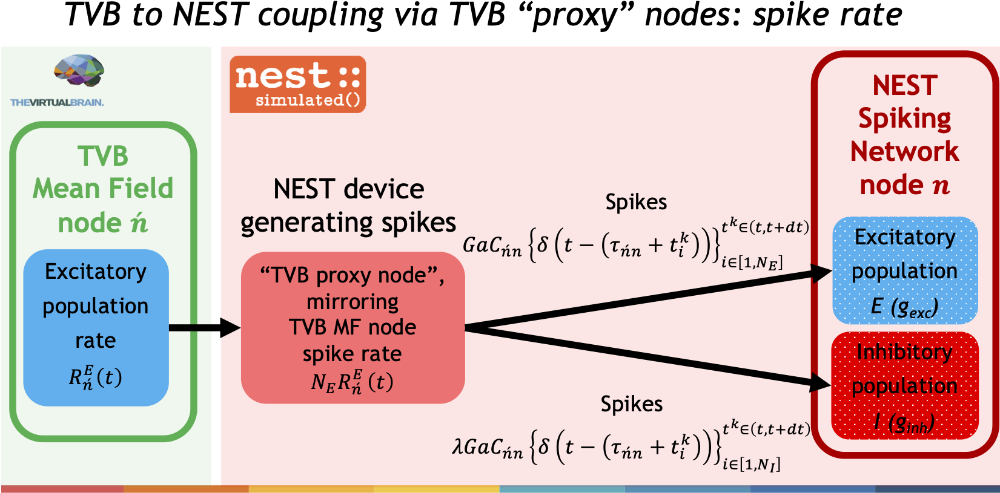

In [3]:
display(Image(filename='./pics/Rate.png',  width=1000, unconfined=False))

In [9]:
#--------For spike transmission from TVB to NEST devices acting as TVB proxy nodes with TVB delays:--------

# Mean spike rates are applied in parallel to all target neurons

if tvb_to_nest_mode == "rate":
    
    tvb_nest_builder.tvb_to_spikeNet_interfaces = [
        {"model": "inhomogeneous_poisson_generator",  # NEST stimulation device to be used
         "params": {"allow_offgrid_times": False}, # parameters for the NEST device
    # # ---------Properties potentially set as function handles with args (tvb_node_id=None)-------------------------
         "interface_weights": 1.0 * N_E, # Convert mean value to total value, i.e., scaling of TVB input
    # Applied outside NEST for each interface device
    # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
        "weights": tvb_weight_fun, "delays": tvb_delay_fun, "receptor_type": 0,
        # --------------------------------------------------------------------------------------------------------------
        #             TVB sv -> NEST population
        "connections": {"R_e": ["E"]},  # connection from TVB state variable to NEST spiking population
        "source_nodes": None, "target_nodes": None}]  # None means all regions' connections 

    if lamda > 0.0:
        tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
            {"model": "inhomogeneous_poisson_generator",
             "params": {"allow_offgrid_times": False},
        # # ---------Properties potentially set as function handles with args (tvb_node_id=None)-------------------------
             "interface_weights": lamda * N_E, # Convert mean value to total value
        # Applied outside NEST for each interface device
        # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
            "weights": tvb_weight_fun, "delays": tvb_delay_fun, "receptor_type": 0,
            # --------------------------------------------------------------------------------------------------------------
            #             TVB sv -> NEST population
            "connections": {"R_e": ["I"]},
            "source_nodes": None, "target_nodes": None   # None means all regions' connections 
            } 
        )



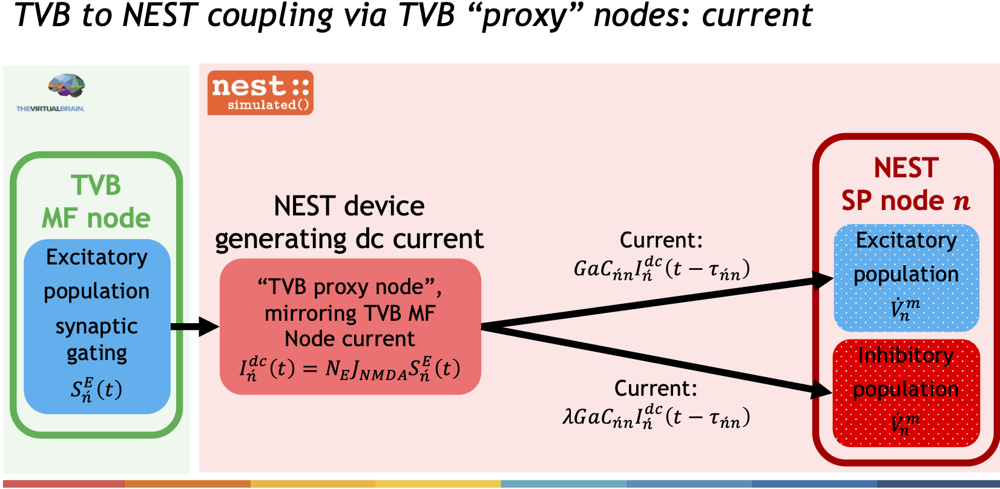

In [4]:
display(Image(filename='./pics/DC.png',  width=1000, unconfined=False))

In [11]:
# Mean currents are distributed to all target neurons

if tvb_to_nest_mode == "current":

    # --For injecting current to NEST neurons via dc generators acting as TVB proxy nodes with TVB delays:--

    tvb_nest_builder.tvb_to_spikeNet_interfaces = [
        {"model": "dc_generator",  # NEST stimulation device to be used
         "params": {}, # parameters for the NEST device
    # Properties potentially set as function handles with args (tvb_node_id=None)
    #   Applied outside NEST for each interface device
         "interface_weights": 1.0,  # N_E / N_E, optional scaling of TVB input
    # Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)
         "weights": tvb_weight_fun, "delays": tvb_delay_fun,
    #                   TVB sv -> NEST population
         "connections": {"S_e": ["E"]}, # connection from TVB state variable to NEST spiking population
         "source_nodes": None, "target_nodes": None}]  # None means all regions' connections 

    if lamda > 0.0:
        tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
           {"model": "dc_generator", "params": {},
        # ---------Properties potentially set as function handles with args (tvb_node_id=None)
        #   Applied outside NEST for each interface device
             "interface_weights": lamda*N_E / N_I,
        # Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)
             "weights": tvb_weight_fun, "delays": tvb_delay_fun,
        #                  TVB sv -> NEST population
             "connections": {"S_e": ["I"]},
             "source_nodes": None, "target_nodes": None}  # None means all regions' connections 
        )



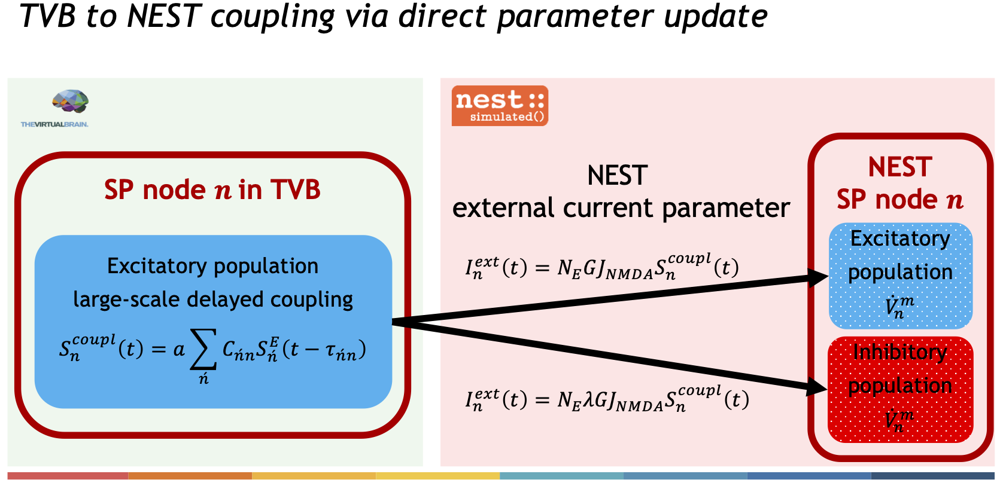

In [12]:
display(Image(filename='./pics/Ie.png',  width=1000, unconfined=False))

In [13]:
# Mean currents are distributed to all target neurons

if tvb_to_nest_mode == "param":

    # --For directly setting an external current parameter in NEST neurons instantaneously:--
    tvb_nest_builder.tvb_to_spikeNet_interfaces = [
        {"model": "current",  # The type of parameter
         "parameter": "I_e",  # The name of NEST model parameter to target
    # Properties potentially set as function handles with args (tvb_node_id=None)
         "interface_weights": G,  # N_E / N_E, optional scaling of TVB input
    #                  TVB sv -> NEST population
         "connections": {"S_e": ["E"]}, # connection from TVB state variable to NEST spiking population
         "nodes": None}]  ## None means all spiking regions
    if lamda > 0.0:
        # Coupling to inhibitory populations as well (feedforward inhibition):
        tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
        {
            "model": "current", "parameter": "I_e",
    # Properties potentially set as function handles with args (tvb_node_id=None)
            "interface_weights": lamda * G * N_E / N_I,
    #                     TVB sv -> NEST population
            "connections": {"S_e": ["I"]},
            "nodes": None}  # None means all spiking regions
    )

    

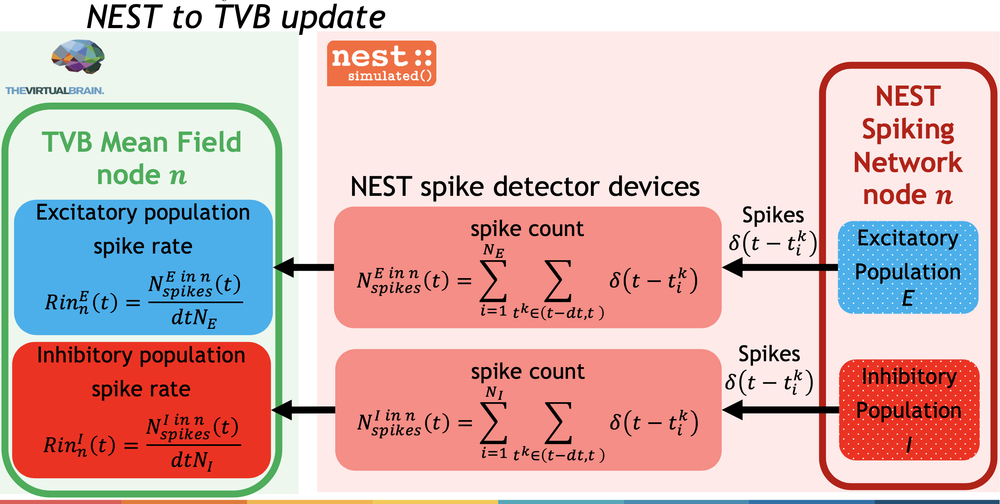

In [14]:
display(Image(filename='./pics/NESTtoTVB.png',  width=1000, unconfined=False))

In [15]:

# NEST -> TVB update:
if nest_to_tvb:
    connections = OrderedDict() # connection from NEST spiking population to TVB state variable
    #            TVB sv <- NEST
    connections["Rin_e"] = ["E"]
    connections["Rin_i"] = ["I"]
    tvb_nest_builder.spikeNet_to_tvb_interfaces = [
        {"model": "spike_recorder",  # NEST device to record spikes
         "params": {},  # Optional parameters to the NEST device 
    # ----Properties potentially set as function handles with args (nest_node_id=None)--
         "interface_weights": 1.0, # optional scaling of NEST -> TVB update
         "delays": 0.0, # optional delay of NEST -> TVB update
    # ---------------------------------------------------------------------------------
         "connections": connections, "nodes": None}]  # None means all spiking regions here

In [16]:

# Finally build the TVB<->NEST interface model:
tvb_nest_model = tvb_nest_builder.build_interface(tvb_to_nest_mode=tvb_to_nest_mode, nest_to_tvb=nest_to_tvb)


2021-01-05 16:27:02,815 - INFO - tvb_multiscale.core.interfaces.base - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2021-01-05 16:27:02,815 - INFO - tvb_multiscale.core.interfaces.base - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2021-01-05 16:27:02,820 - INFO - tvb_multiscale.tvb_nest.interfaces.models - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2021-01-05 16:27:02,820 - INFO - tvb_multiscale.tvb_nest.interfaces.models - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2021-01-05 16:27:02,837 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
2021-01-05 16:27:02,837 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
20

In [17]:

# Print a summary report of the TVB<->NEST interface model and, optionally, its connectivity:
print(tvb_nest_model.print_str(detailed_output=True, 
                               connectivity=False))  # True, will take some time!



----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
RedWWexcIOinhI TVB-NEST Interface


----------------------------------------------------------------------------------------------------


TVB to spikeNet interfaces:

----------------------------------------------------------------------------------------------------

Index: 0_R_e->['E']

TVBtoNESTInhomogeneousPoissonGeneratorInterface
Name: R_e, TVB state variable indice: 2, 
Interface weights: [100.0]
Source TVB nodes' indices:
0...33, 36...67 
Target NEST nodes' indices:
34...35 
TVBtoNESTInhomogeneousPoissonGeneratorInterface - Name: R_e, Model: inhomogeneous_poisson_generator,
Devices:
-----------------------------------------------------------------------------------------------

## 4. Configure simulator, simulate, gather results

In [18]:
# Configure the simulator including the TVB-NEST interface model...
simulator.configure(tvb_spikeNet_interface=tvb_nest_model)
# ...and simulate!
simulation_length=110.0  # Set at least 1100.0 for a meaningful simulation
transient = simulation_length/11  # a transient to be removed for rate and correlation computations
t = time.time()
results = simulator.run(simulation_length=simulation_length)
# Integrate NEST one more NEST time step so that multimeters get the last time point
# unless you plan to continue simulation later
simulator.run_spiking_simulator(simulator.tvb_spikeNet_interface.nest_instance.GetKernelStatus("resolution"))
print("\nSimulated in %f secs!" % (time.time() - t))


Simulated in 36.578570 secs!


In [19]:
# Clean-up NEST simulation
simulator.tvb_spikeNet_interface.nest_instance.Cleanup()

## 5. Plot results and write them to HDF5 files

In [20]:
# Set plot_per_neuron to False for faster plotting of only mean field variables and dates:
plot_per_neuron = True 
MAX_VARS_IN_COLS = 3
MAX_REGIONS_IN_ROWS = 10
MIN_REGIONS_FOR_RASTER_PLOT = 9
# from examples.plot_write_results import plot_write_results
# populations = []
# populations_sizes = []
# for pop in nest_model_builder.populations:
#     populations.append(pop["label"])
#     populations_sizes.append(int(np.round(pop["scale"] * nest_model_builder.population_order)))
# plot_write_results(results, simulator, populations=populations, populations_sizes=populations_sizes, 
#                    transient=transient, tvb_state_variable_type_label="State Variables", 
#                    tvb_state_variables_labels=simulator.model.variables_of_interest, 
#                    plot_per_neuron=plot_per_neuron, plotter=plotter, config=config)

In [21]:
# If you want to see what the function above does, take the steps, one by one
try:
    # We need framework_tvb for writing and reading from HDF5 files
    from tvb_multiscale.core.io.h5_writer import H5Writer
    writer = H5Writer()
except:
    writer = False
    
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion
from tvb.contrib.scripts.datatypes.time_series_xarray import TimeSeriesRegion as TimeSeriesXarray

# Put the results in a Timeseries instance
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion

source_ts = TimeSeriesXarray(  # substitute with TimeSeriesRegion fot TVB like functionality
        data=results[0][1], time=results[0][0],
        connectivity=simulator.connectivity,
        labels_ordering=["Time", "State Variable", "Region", "Neurons"],
        labels_dimensions={"State Variable": list(simulator.model.variables_of_interest),
                           "Region": simulator.connectivity.region_labels.tolist()},
        sample_period=simulator.integrator.dt)
source_ts.configure()

t = source_ts.time
    
# Write to file
if writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(source_ts._data,
                                                                    connectivity=source_ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, source_ts.title)+".h5")
source_ts

,value
Dimensions,"['Time', 'State Variable', 'Region', 'Neurons']"
Length,1100
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: 3338c726-3a00-4aef-871a-7533ff27ea54
Time units,ms
Time-series name,Region Time Series
Time-series type,TimeSeriesRegion
"[min, median, max]","[-0.713882, 0.225661, 3100]"


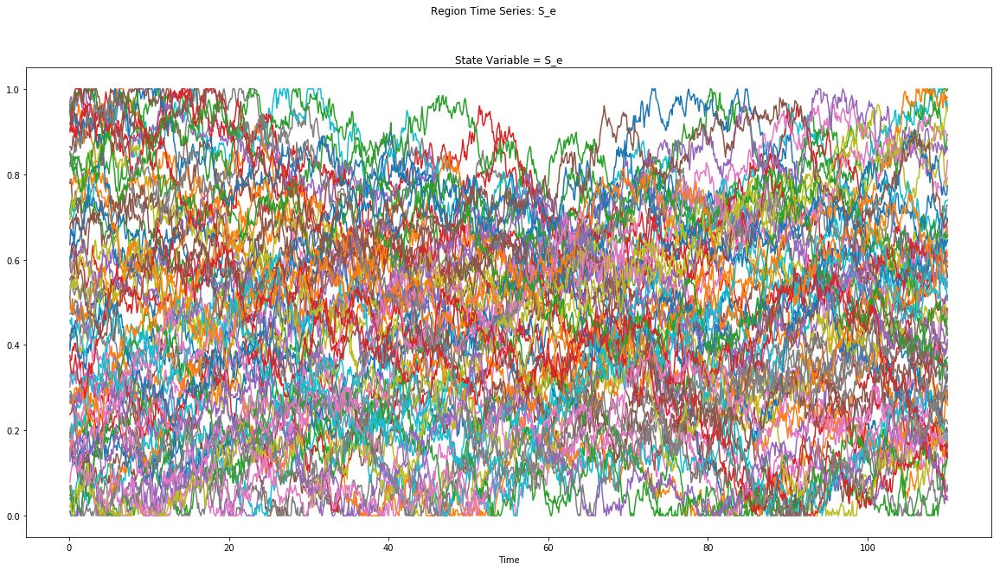

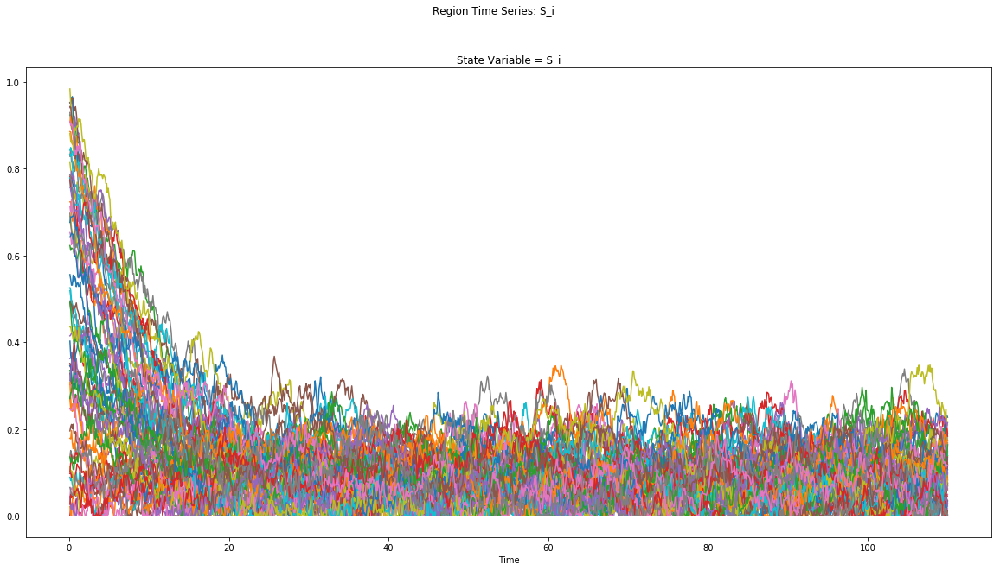

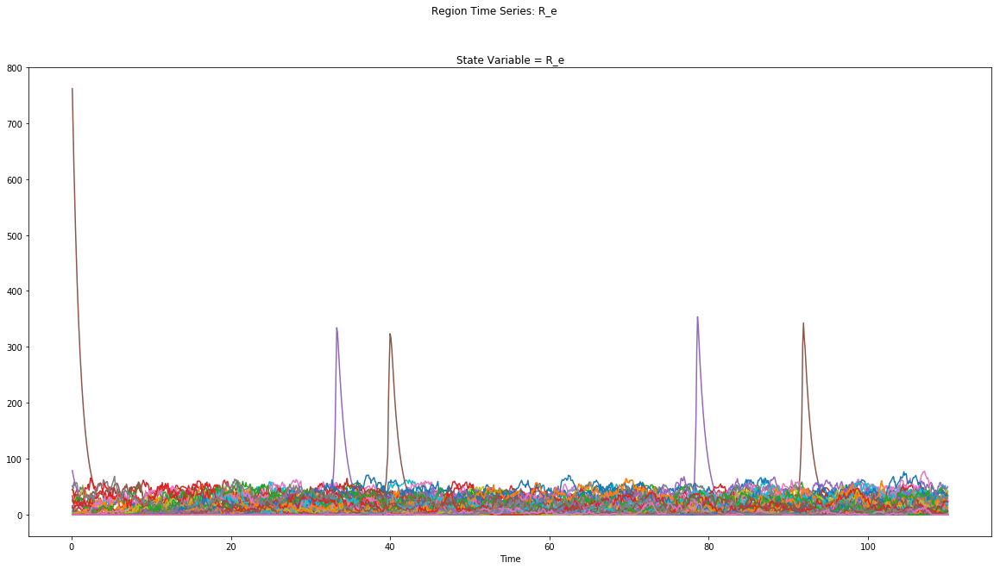

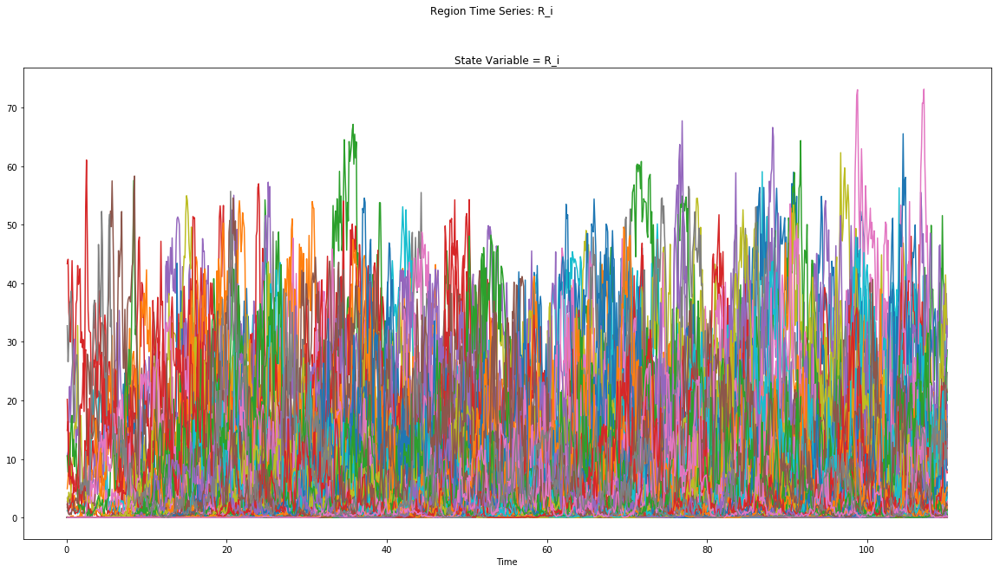

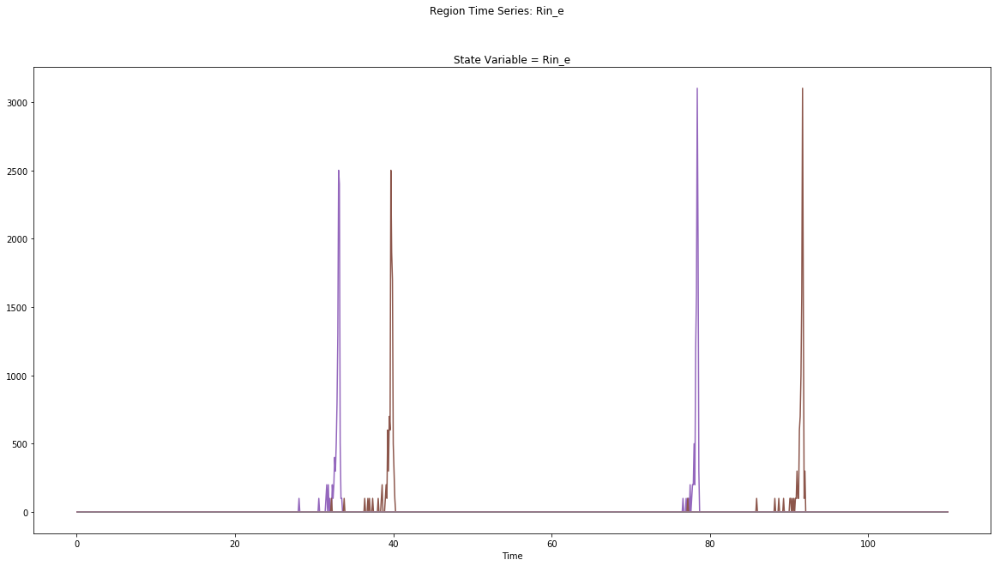

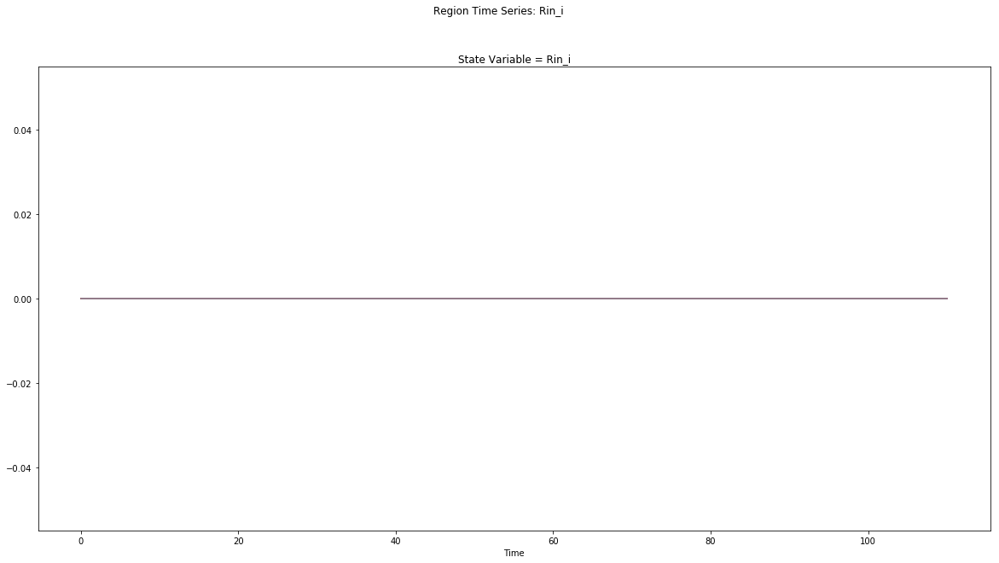

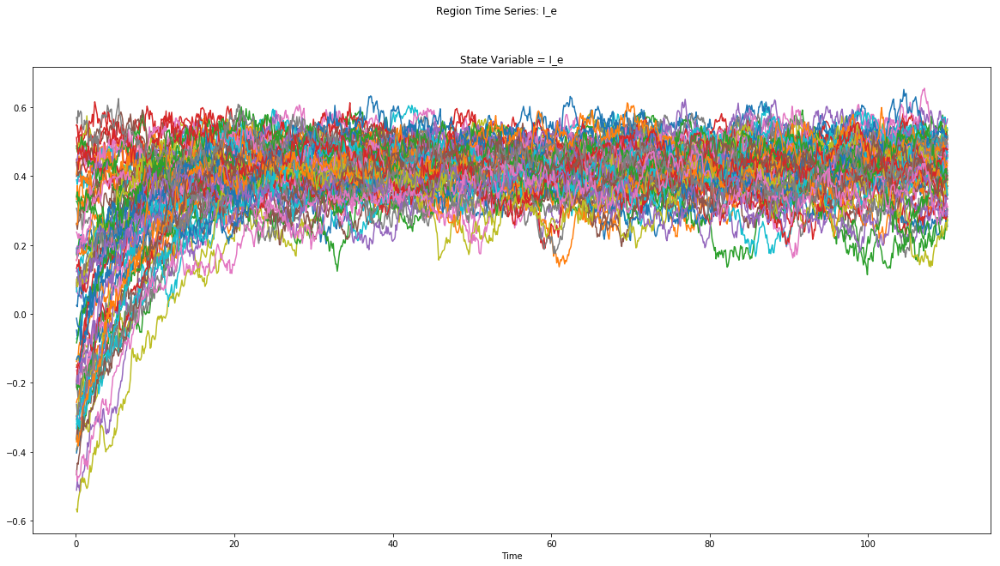

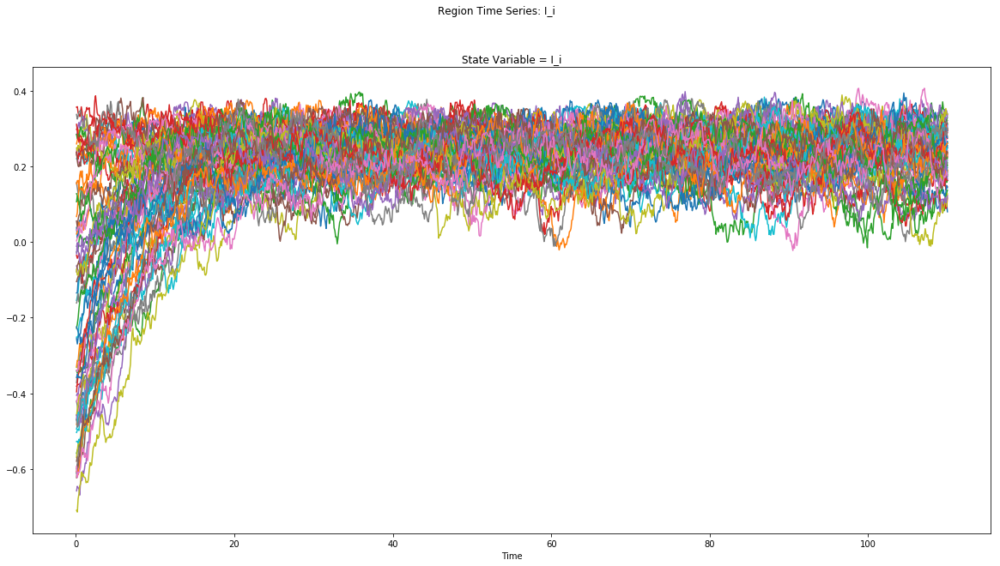

In [22]:
# Plot TVB time series
source_ts.plot_timeseries(plotter_config=plotter.config, 
                          hue="Region" if source_ts.shape[2] > MAX_REGIONS_IN_ROWS else None, 
                          per_variable=source_ts.shape[1] > MAX_VARS_IN_COLS, 
                          figsize=FIGSIZE);

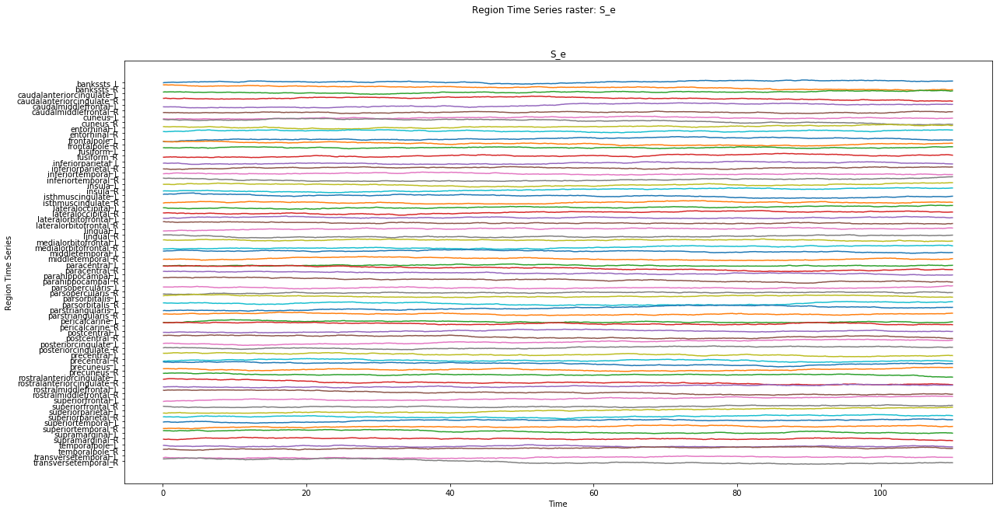

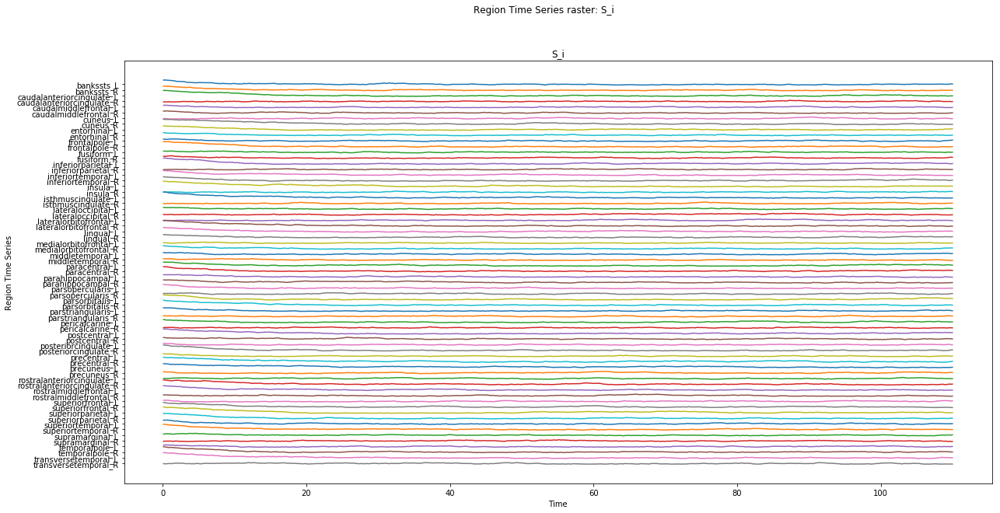

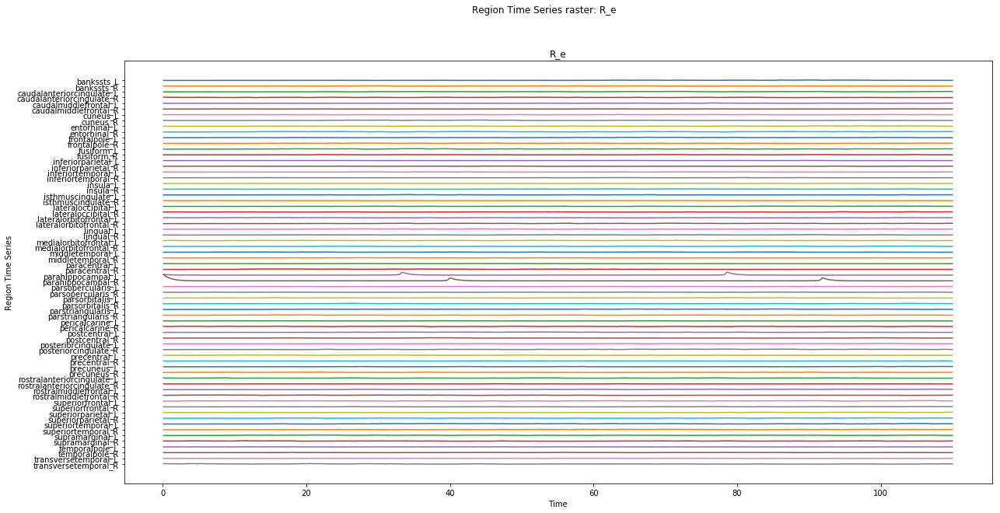

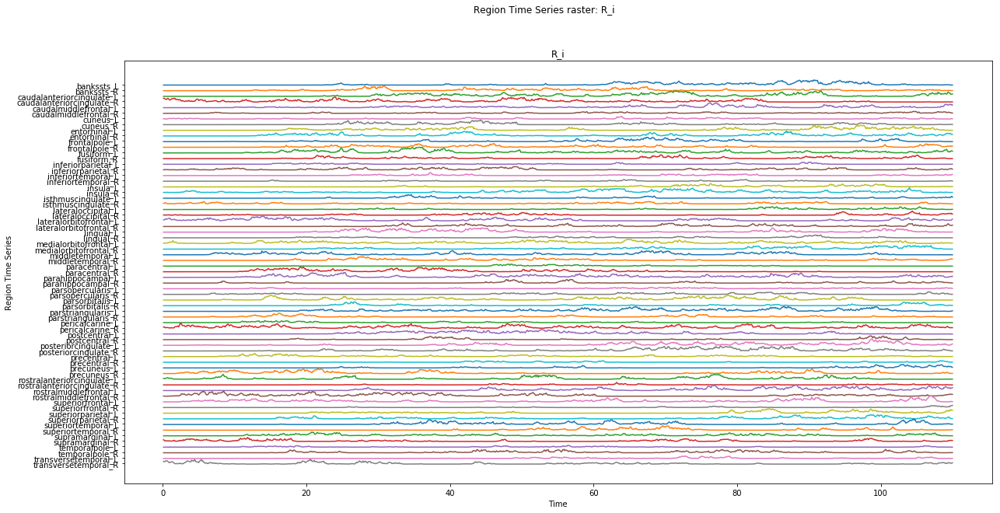

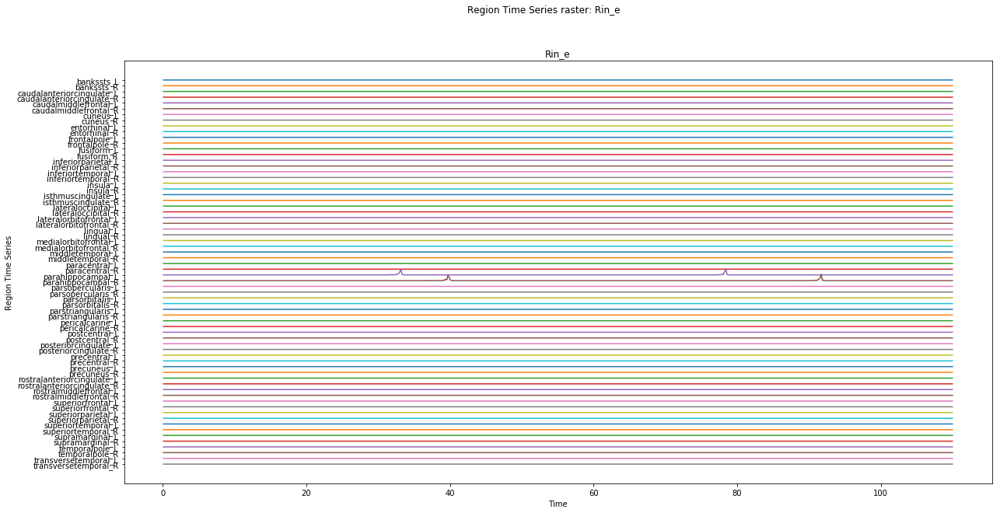

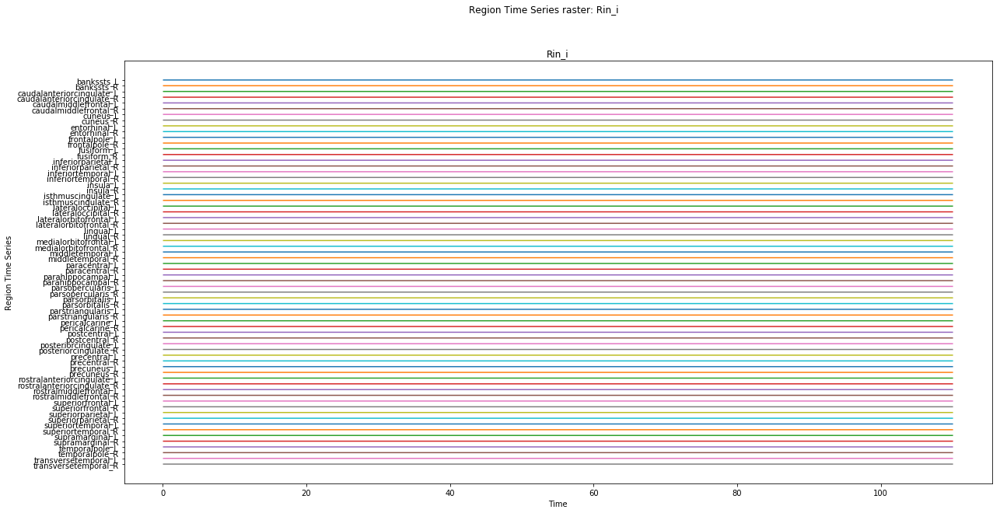

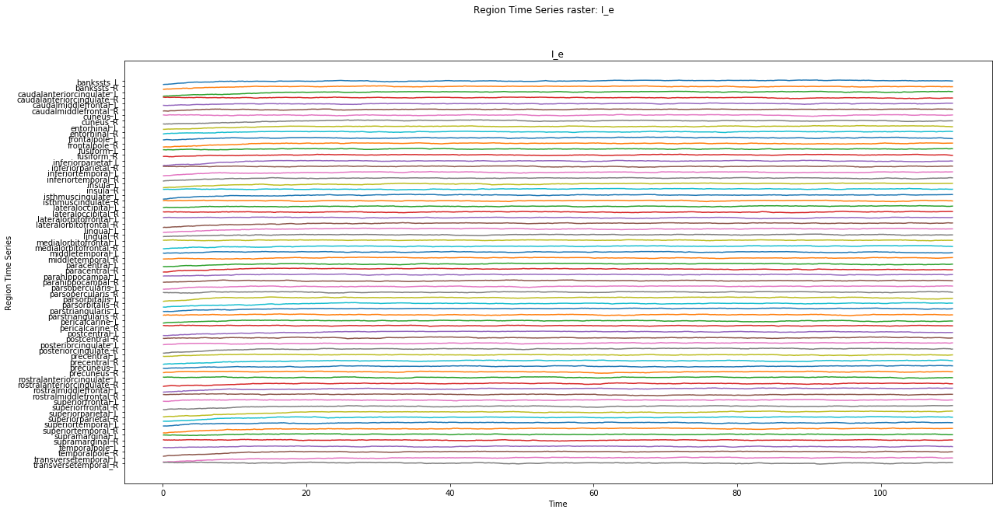

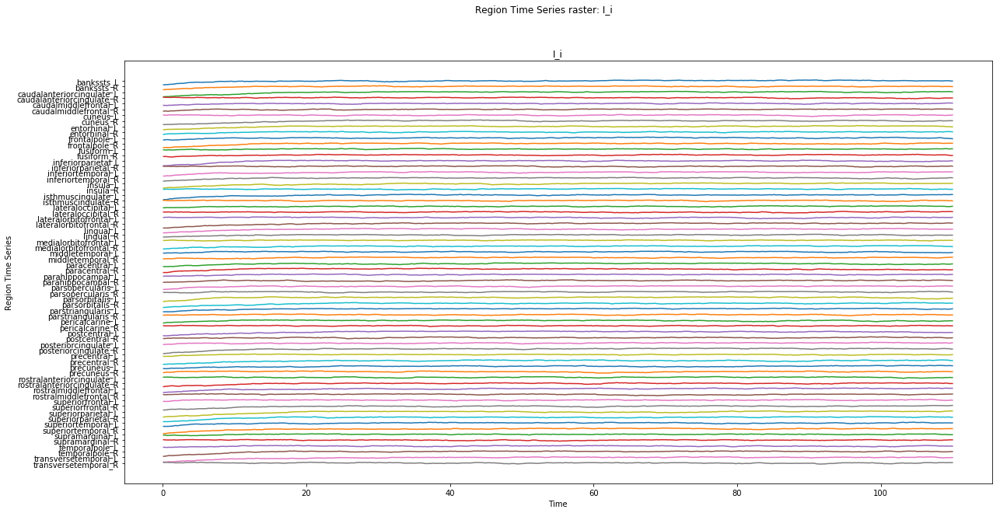

In [23]:
# TVB time series raster plot:
if source_ts.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
    source_ts.plot_raster(plotter_config=plotter.config, 
                          per_variable=source_ts.shape[1] > MAX_VARS_IN_COLS,
                          figsize=FIGSIZE);

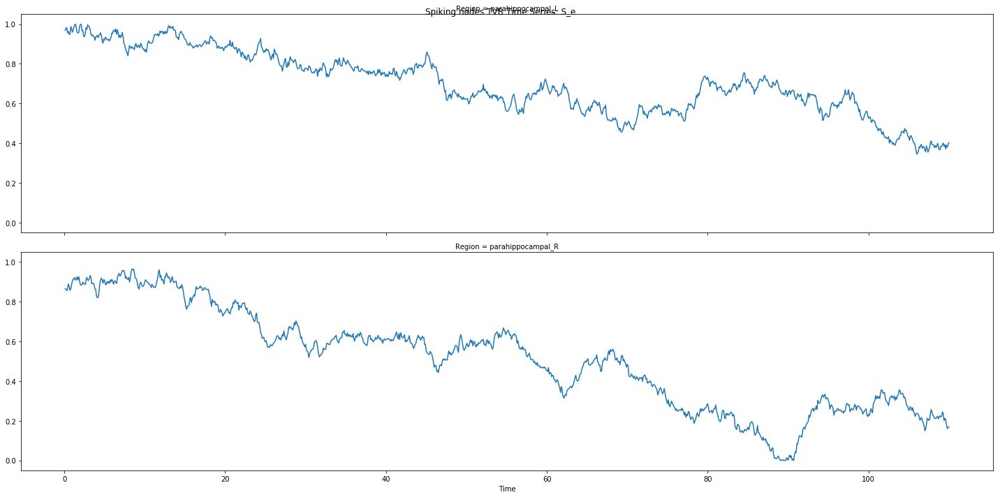

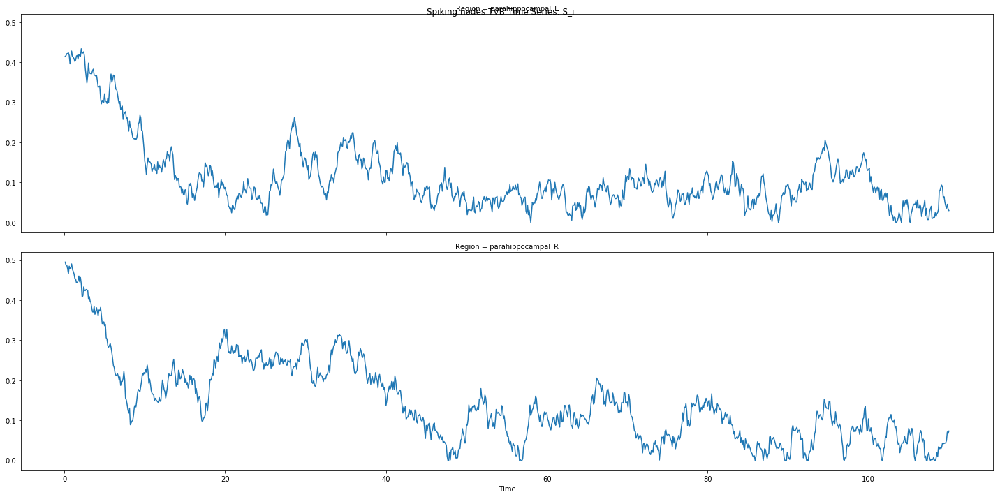

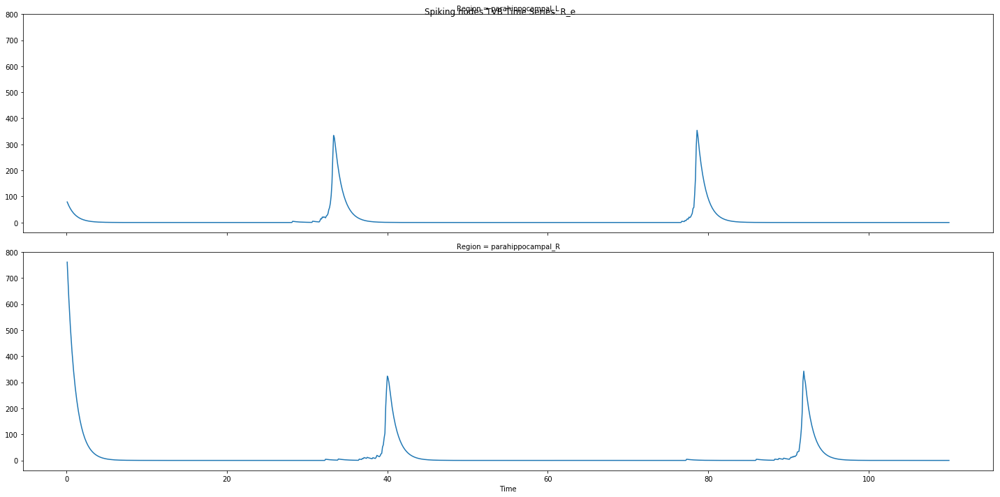

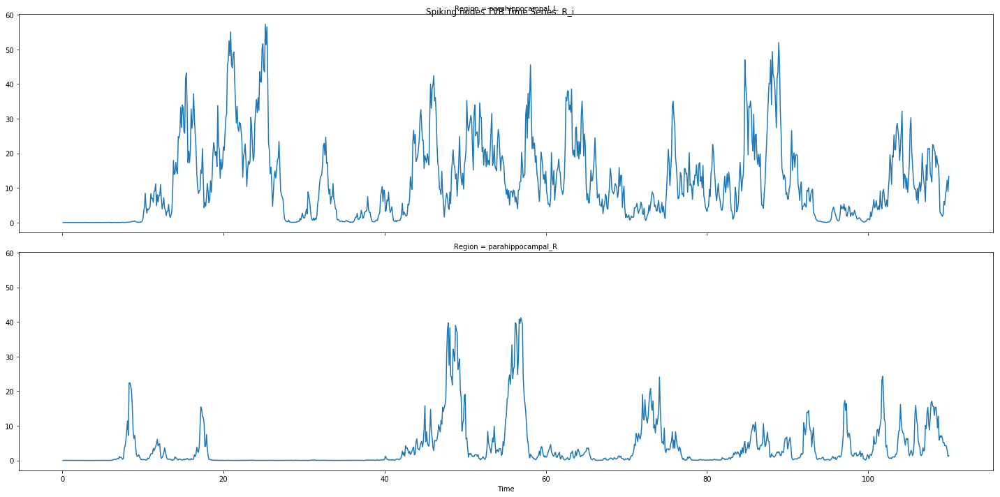

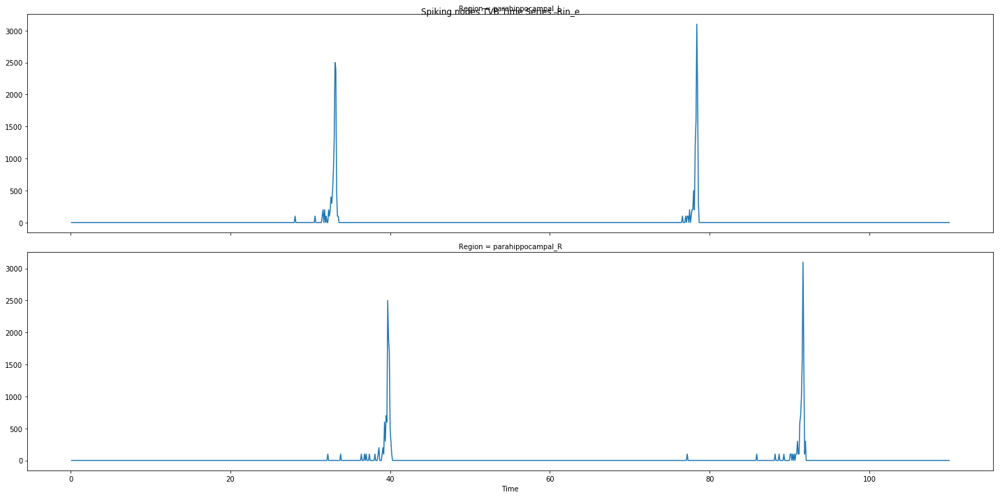

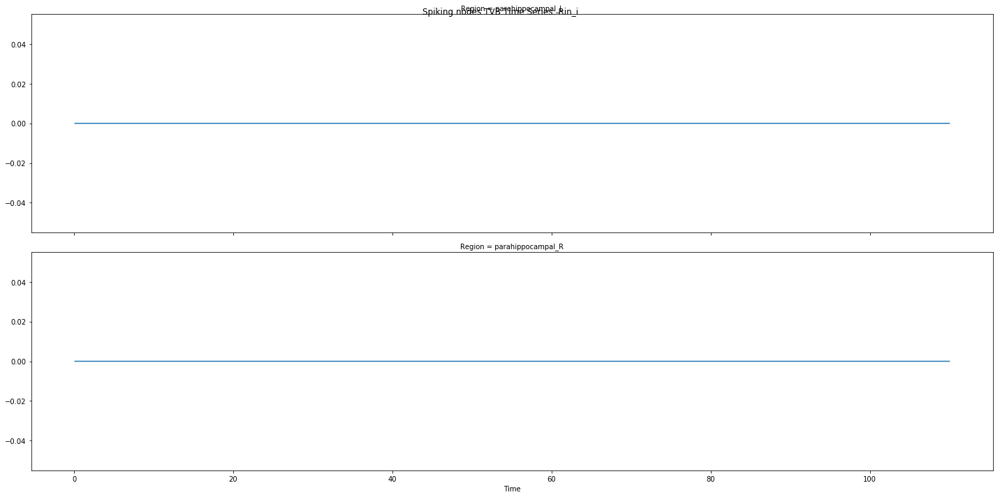

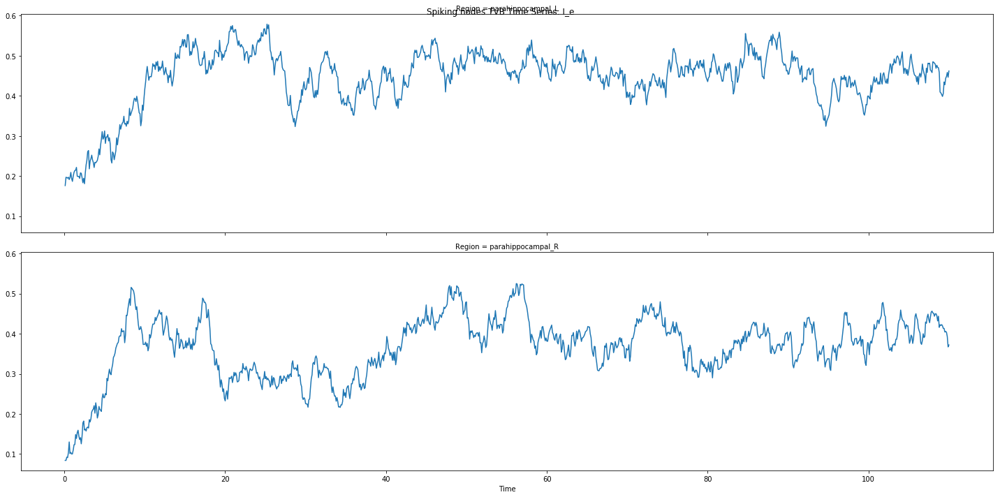

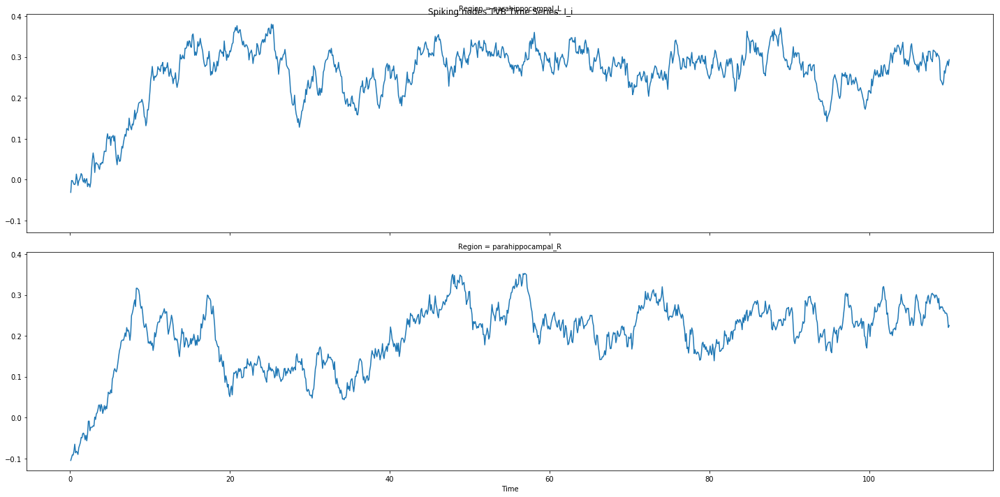

In [24]:
# Focus on the nodes modelled in NEST: 
n_spiking_nodes = len(simulator.tvb_spikeNet_interface.spiking_nodes_ids)
source_ts_nest = source_ts[:, :, simulator.tvb_spikeNet_interface.spiking_nodes_ids]
source_ts_nest.plot_timeseries(plotter_config=plotter.config, 
                               hue="Region" if source_ts_nest.shape[2] > MAX_REGIONS_IN_ROWS else None, 
                               per_variable=source_ts_nest.shape[1] > MAX_VARS_IN_COLS, 
                               figsize=FIGSIZE, figname="Spiking nodes TVB Time Series");

In [25]:
# Focus on the nodes modelled in NEST: raster plot
if source_ts_nest.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
    source_ts_nest.plot_raster(plotter_config=plotter.config, 
                               per_variable=source_ts_nest.shape[1] > MAX_VARS_IN_COLS,
                               figsize=FIGSIZE, figname="Spiking nodes TVB Time Series Raster");

### Spiking Network plots

In [26]:
from tvb_multiscale.tvb_elephant.spiking_network_analyser import SpikingNetworkAnalyser
# Create a SpikingNetworkAnalyzer:
spikeNet_analyzer = \
    SpikingNetworkAnalyser(spikeNet=nest_network,
                           start_time=source_ts.time[0], end_time=source_ts.time[-1], 
                           period=simulator.monitors[0].period, transient=transient,
                           time_series_output_type="TVB", return_data=True, 
                           force_homogeneous_results=True, connectivity=simulator.connectivity)

### Plot spikes' raster and mean spike rates and correlations

In [27]:
# Spikes rates and correlations per Population and Region
spikes_res = \
    spikeNet_analyzer.\
        compute_spikeNet_spikes_rates_and_correlations(
            populations_devices=None, regions=None,
            rates_methods=[], rates_kwargs=[{}], rate_results_names=[],
            corrs_methods=[], corrs_kwargs=[{}], corrs_results_names=[], bin_kwargs={},
            data_method=spikeNet_analyzer.get_spikes_from_device, data_kwargs={},
            return_devices=False
        );

/home/docker/env/neurosci/lib/python3.7/site-packages/elephant/conversion.py:848: UserWarning:Binning discarded 67 last spike(s) of the input spiketrain


<xarray.DataArray "Mean Populations' Spikes' Rates" (Population: 2, Region: 2)>
array([[20.22021982, 21.1211207 ],
       [20.12011972, 20.12011972]])
Coordinates:
  * Region      (Region) object 'parahippocampal_L' 'parahippocampal_R'
  * Population  (Population) object 'E_spikes' 'I_spikes'
<xarray.DataArray "Populations' Correlation Coefficient" (Population_i: 2, Population_j: 2, Region_i: 2, Region_j: 2)>
array([[[[ 1.        , -0.01202794],
         [-0.01202794,  1.        ]],

        [[ 0.64398612, -0.00901139],
         [-0.00833671,  0.87340698]]],


       [[[ 0.64398612, -0.00833671],
         [-0.00901139,  0.87340698]],

        [[ 1.        , -0.0062459 ],
         [-0.0062459 ,  1.        ]]]])
Coordinates:
  * Population_i  (Population_i) object 'E_spikes' 'I_spikes'
  * Region_i      (Region_i) object 'parahippocampal_L' 'parahippocampal_R'
  * Population_j  (Population_j) object 'E_spikes' 'I_spikes'
  * Region_j      (Region_j) object 'parahippocampal_L' 'parahippoc

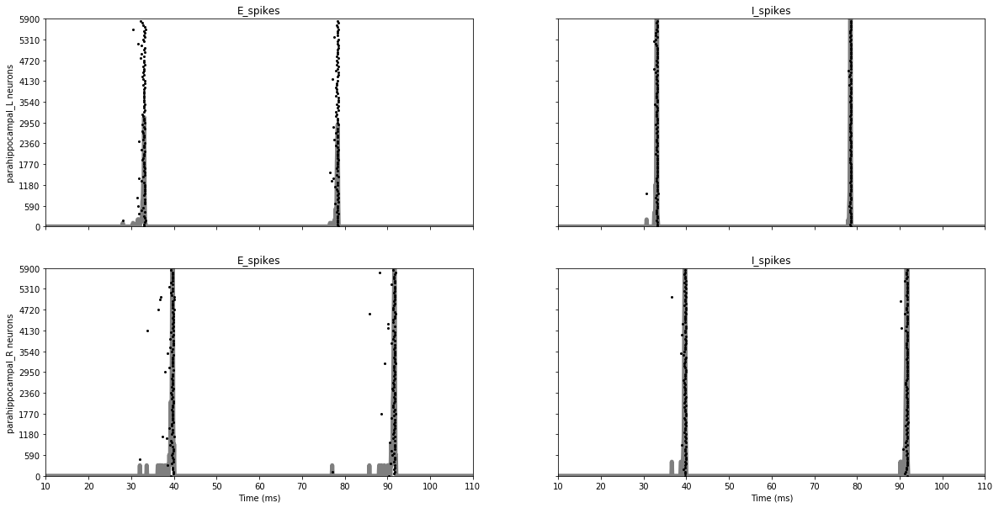

<Figure size 432x288 with 0 Axes>

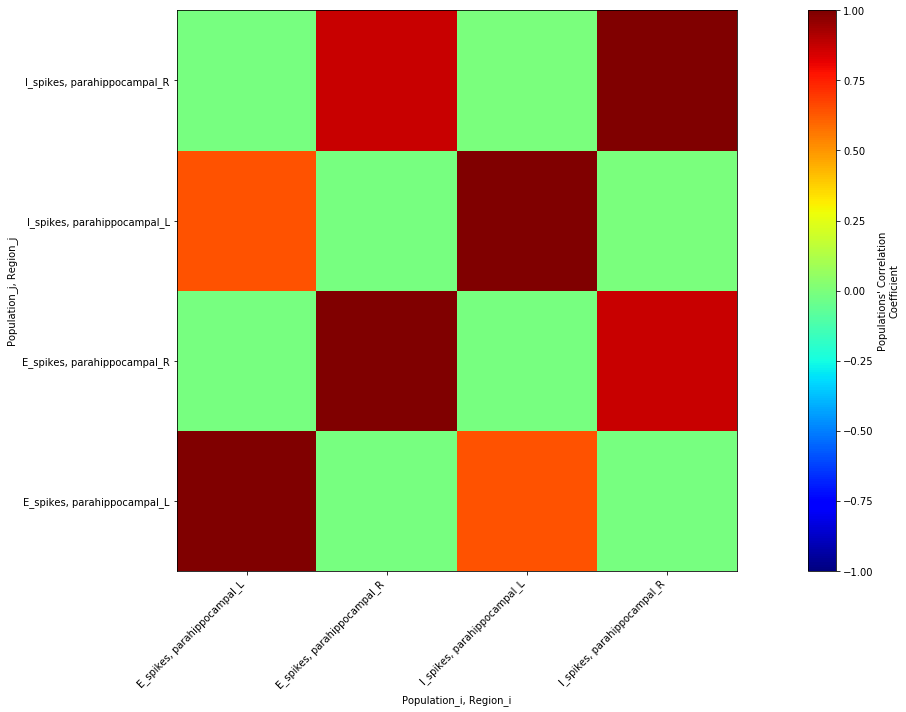

In [28]:
if spikes_res:
    print(spikes_res["mean_rate"])
    print(spikes_res["spikes_correlation_coefficient"])
    # Plot spikes' rasters together with mean population's spikes' rates' time series
    if plotter:
        plotter.plot_spike_events(spikes_res["spikes"], rates=spikes_res["mean_rate_time_series"], figsize=FIGSIZE)
        from tvb_multiscale.core.plot.correlations_plot import plot_correlations
        plot_correlations(spikes_res["spikes_correlation_coefficient"], plotter)

In [29]:
if spikes_res and writer:
    writer.write_object(spikes_res["spikes"].to_dict(), 
                        path=os.path.join(config.out.FOLDER_RES,  "Spikes") + ".h5");
    writer.write_object(spikes_res["mean_rate"].to_dict(),
                        path=os.path.join(config.out.FOLDER_RES,
                                          spikes_res["mean_rate"].name) + ".h5");
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(
                              spikes_res["mean_rate_time_series"]._data,
                               connectivity=spikes_res["mean_rate_time_series"].connectivity),
                           os.path.join(config.out.FOLDER_RES,
                                        spikes_res["mean_rate_time_series"].title) + ".h5",
                           recursive=False);
    writer.write_object(spikes_res["spikes_correlation_coefficient"].to_dict(),
                        path=os.path.join(config.out.FOLDER_RES,
                                          spikes_res["spikes_correlation_coefficient"].name) + ".h5");

2021-01-05 16:28:09,483 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/RedWongWang/res/Spikes.h5
2021-01-05 16:28:09,483 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/RedWongWang/res/Spikes.h5
2021-01-05 16:28:09,507 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/E_spikes/parahippocampal_L" (2 members)> dataset <class 'numpy.ndarray'> senders:
[  4  96  15  11  89   7  42  24  82 100  38  84  88   9  23  47  50  55
  73  99  33  25  43  69  98  34  46  72  75  78  10  54  91  22  49  56
  58   1  30  32  44  62  63  64  74  80   6  16  31  35  36  40  45  52
  61  76  77  81  95   2  28  39  53  59  65  66  67  83  86  90  93   3
   5   8  12  13  17  20  21  26  27  29  41  51  57  60  68  70  71  79
  19  37  85  94  97  14  18  48  92  87   4  96

2021-01-05 16:28:09,538 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/E_spikes/parahippocampal_R" (2 members)> dataset <class 'numpy.ndarray'> times:
[32.15 33.8  36.35 36.75 37.   37.35 38.05 38.45 38.55 38.6  38.95 39.05
 39.05 39.15 39.25 39.25 39.3  39.3  39.3  39.3  39.4  39.4  39.4  39.45
 39.45 39.45 39.45 39.5  39.5  39.5  39.55 39.55 39.6  39.6  39.6  39.6
 39.65 39.65 39.65 39.65 39.65 39.65 39.65 39.65 39.65 39.7  39.7  39.7
 39.7  39.7  39.7  39.7  39.7  39.7  39.7  39.7  39.7  39.7  39.7  39.7
 39.7  39.75 39.75 39.75 39.75 39.75 39.75 39.75 39.8  39.8  39.8  39.8
 39.8  39.8  39.8  39.8  39.8  39.8  39.8  39.8  39.85 39.85 39.85 39.85
 39.85 39.85 39.85 39.85 39.85 39.85 39.9  39.9  39.9  39.9  39.9  39.9
 39.9  39.95 39.95 39.95 39.95 40.   40.05 40.1  40.1  40.15 77.15 85.85
 88.15 88.65 89.3  90.1  90.2  90.4  90.6  90.8  90.9  90.95 90.95 91.
 91.1  91.15 91.25 91.25 91.3  91.3  91.3  91.3  91.35 91.35 91.35 91.4
 91.4  91.4  91.4  9

2021-01-05 16:28:09,574 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/I_spikes/parahippocampal_R" (2 members)> dataset <class 'numpy.ndarray'> times:
[36.7  38.9  38.95 39.05 39.15 39.4  39.45 39.5  39.55 39.55 39.55 39.6
 39.6  39.65 39.65 39.65 39.65 39.65 39.65 39.65 39.65 39.65 39.7  39.7
 39.7  39.7  39.75 39.75 39.75 39.75 39.75 39.75 39.75 39.75 39.75 39.75
 39.75 39.8  39.8  39.8  39.8  39.8  39.8  39.8  39.8  39.8  39.8  39.85
 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85
 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.85 39.9  39.9
 39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9
 39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.9  39.95 39.95
 39.95 39.95 40.   40.05 40.05 90.25 90.45 90.85 91.1  91.2  91.25 91.3
 91.35 91.4  91.4  91.45 91.45 91.45 91.5  91.5  91.5  91.55 91.55 91.55
 91.55 91.55 91.6  91.6  91.6  91.6  91.6  91.6  91.6  91.65 91.65 91.65
 91.65 91.65 91.6

2021-01-05 16:28:09,815 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/RedWongWang/res/Populations' Correlation Coefficient.h5
2021-01-05 16:28:09,815 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/RedWongWang/res/Populations' Correlation Coefficient.h5
2021-01-05 16:28:09,825 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2021-01-05 16:28:09,825 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2021-01-05 16:28:09,829 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to h5 file as a numpy array dataset !

2021-01-05 16:28:09,829 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to h5 file as a numpy

### Get  SpikingNetwork mean field variable time series and plot them

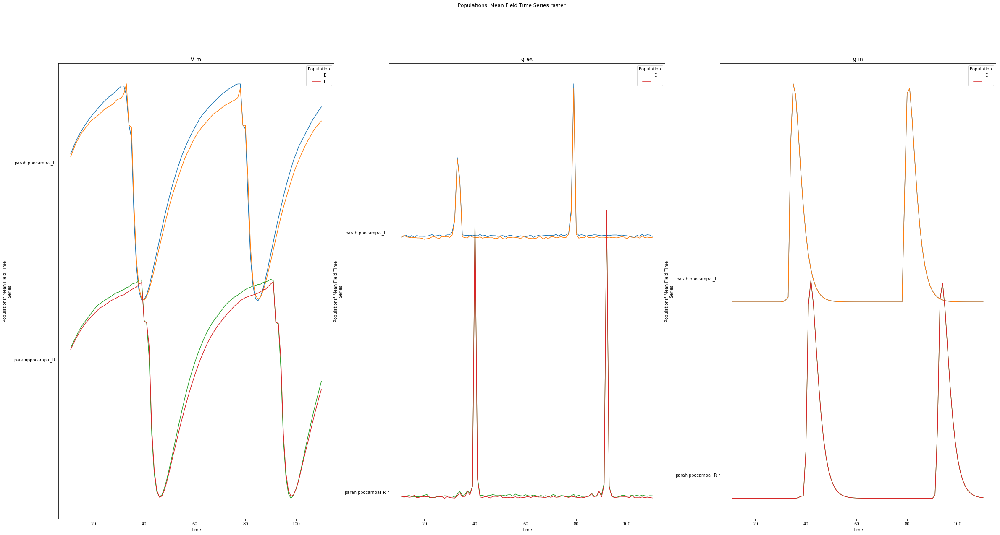

In [30]:
# Continuous time variables' data of spiking neurons
if plot_per_neuron:
    spikeNet_analyzer.return_data = True
else:
    spikeNet_analyzer.return_data = False
spikeNet_ts = \
    spikeNet_analyzer. \
         compute_spikeNet_mean_field_time_series(populations_devices=None, regions=None, variables=None,
                                                 computations_kwargs={}, data_kwargs={}, return_devices=False)
if spikeNet_ts:
    if plot_per_neuron:
        mean_field_ts = spikeNet_ts["mean_field_time_series"]  # mean field
        spikeNet_ts = spikeNet_ts["data_by_neuron"]  # per neuron data
    else:
        mean_field_ts = spikeNet_ts
        spikeNet_ts = None
    if mean_field_ts and mean_field_ts.size > 0:
        mean_field_ts.plot_timeseries(plotter_config=plotter.config, 
                                      per_variable=mean_field_ts.shape[1] > MAX_VARS_IN_COLS)
        if mean_field_ts.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
            mean_field_ts.plot_raster(plotter_config=plotter.config, 
                                      per_variable=mean_field_ts.shape[1] > MAX_VARS_IN_COLS,
                                      linestyle="--", alpha=0.5, linewidth=0.5)
else:
    mean_field_ts = None

In [31]:
# Write results to file:
if mean_field_ts and writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(
                                       mean_field_ts._data,
                                       connectivity=mean_field_ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, mean_field_ts.title) + ".h5", 
                           recursive=False)

### Compute per neuron spikes' rates times series and plot them

<Figure size 432x288 with 0 Axes>

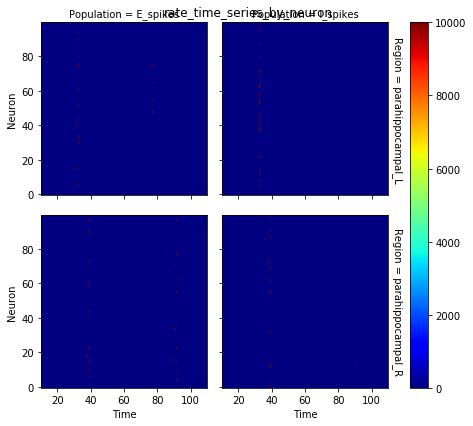

In [32]:
if spikes_res and plot_per_neuron:
    from tvb.simulator.plot.base_plotter import pyplot
    spikeNet_analyzer.return_data = False
    rates_ts_per_neuron = \
        spikeNet_analyzer. \
            compute_spikeNet_rates_time_series(populations_devices=None, regions=None,
                                               computations_kwargs={}, data_kwargs={},
                                               return_spikes_trains=False, return_devices=False);
    if rates_ts_per_neuron is not None and rates_ts_per_neuron.size:
        # Regions in rows
        row = rates_ts_per_neuron.dims[2] if rates_ts_per_neuron.shape[2] > 1 else None
        if row is None:
            # Populations in rows
            row = rates_ts_per_neuron.dims[1] if rates_ts_per_neuron.shape[1] > 1 else None
            col = None
        else:
            # Populations in columns
            col = rates_ts_per_neuron.dims[1] if rates_ts_per_neuron.shape[1] > 1 else None
        pyplot.figure()
        rates_ts_per_neuron.plot(y=rates_ts_per_neuron.dims[3], row=row, col=col, cmap="jet")
        plotter.base._save_figure(figure_name="Spike rates per neuron")
        # del rates_ts_per_neuron # to free memory

### Plot per neuron SpikingNetwork time series

<Figure size 432x288 with 0 Axes>

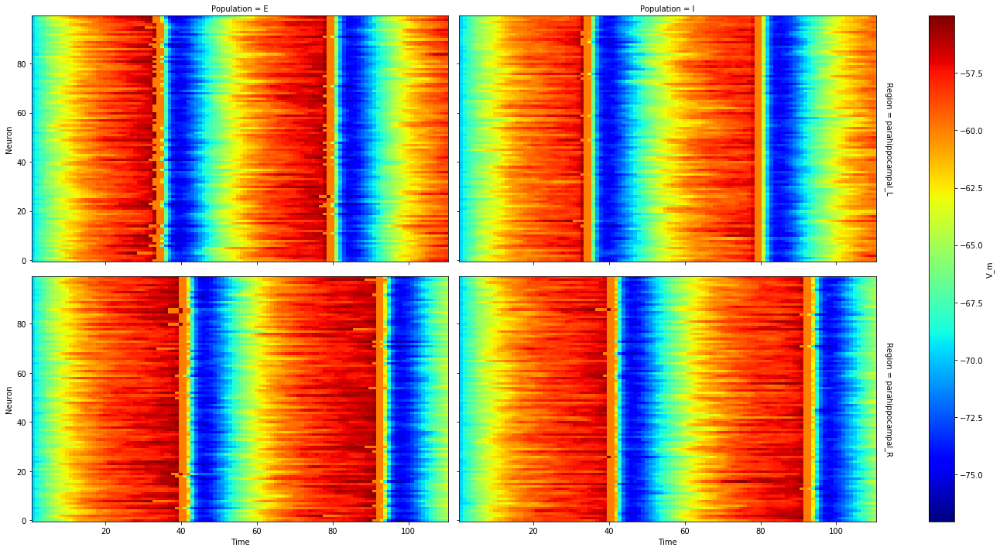

<Figure size 432x288 with 0 Axes>

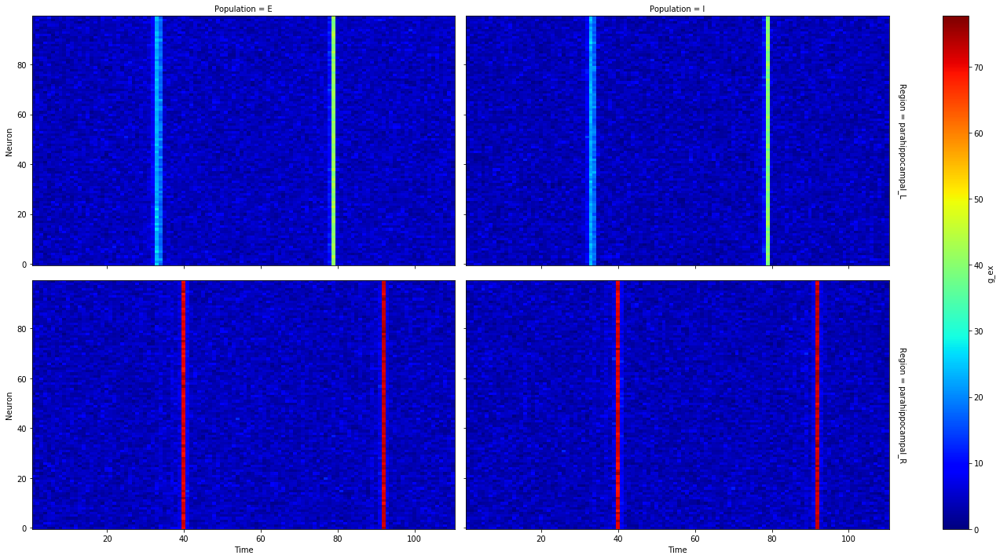

<Figure size 432x288 with 0 Axes>

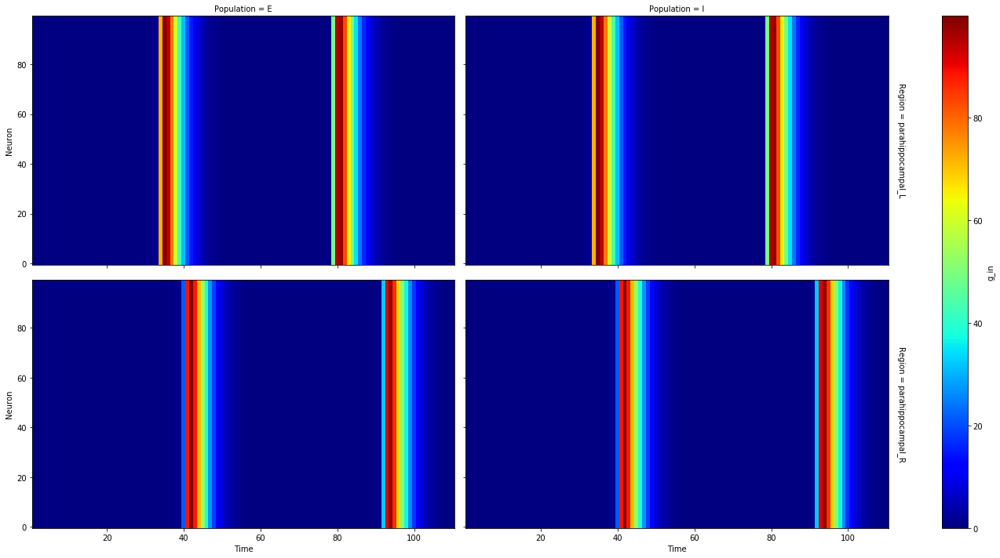

In [33]:
# Regions in rows
if spikeNet_ts is not None and spikeNet_ts.size:
    row = spikeNet_ts.dims[2] if spikeNet_ts.shape[2] > 1 else None
    if row is None:
        # Populations in rows
        row = spikeNet_ts.dims[3] if spikeNet_ts.shape[3] > 1 else None
        col = None
    else:
        # Populations in cols
         col = spikeNet_ts.dims[3] if spikeNet_ts.shape[3] > 1 else None
    for var in spikeNet_ts.coords[spikeNet_ts.dims[1]]:
        this_var_ts = spikeNet_ts.loc[:, var, :, :, :]
        this_var_ts.name = var.item()
        pyplot.figure()
        this_var_ts.plot(y=spikeNet_ts.dims[4], row=row, col=col, cmap="jet", figsize=FIGSIZE)
        plotter.base._save_figure(
            figure_name="Spiking Network variables' time series per neuron: %s" % this_var_ts.name)
    del spikeNet_ts # to free memory

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>

3 Deco Gustavo, Ponce-Alvarez Adrian, Patric Hagmann, <br>
  Gian Luca Romani, Dante Mantini,and Maurizio Corbetta. <br>
  How local Excitation-Inhibition Ratio Impacts the Whole Brain Dynamics <br>
  The Journal of Neuroscience 34(23), 7886-7898, 2014.<br>
  
4 Deco Gustavo, Ponce-Alvarez Adrian, Dante Mantini,<br>
  Gian Luca Romani, Patric Hagmann, and Maurizio Corbetta. <br>
  How local Excitation-Inhibition Ratio Impacts the Whole Brain Dynamics <br>
  The Journal of Neuroscience 33(27), 11239-11252, 2013.<br>
  
5 Meffin H, Burkitt AN, Grayden DB 2004.  <br>
  An analytical model for the large, fluctuating synaptic  <br>
  conductance state typical of neocortical neurons in vivo.  <br>
  Journal of Computational Neuroscience, 16:159-175.  <br>
  DOI: https://doi.org/10.1023/B:JCNS.0000014108.03012.81

6 Bernander O, Douglas RJ, Martin KAC, Koch C 1991.  <br>
  Synaptic background activity influences spatiotemporal  <br>
  integration in single pyramidal cells.  <br>
  Proceedings of the National Academy of Science USA, 88(24):11569-11573.  <br>
  DOI: https://doi.org/10.1073/pnas.88.24.11569

7 Kuhn A, Rotter S 2004.  <br>
  Neuronal integration of synaptic input in  <br>
  the fluctuation- driven regime.  <br>
  Journal of Neuroscience, 24(10):2345-2356. <br>
  DOI: https://doi.org/10.1523/JNEUROSCI.3349-03.2004

8 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>